In [2]:
import uproot as up
import awkward as ak
import pandas as pd
from scipy.optimize import curve_fit

import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm, trange
from pathlib import Path

import mplhep as hep
hep.style.use('ROOT')

In [3]:
class Event:
    def __init__(self, time_since_last_trigger_us, timestamp_us, nhits, 
                 digit_pmt_id, digit_charge_pc, total_digit_charge_pc, digit_time_ns, digit_ncrossings, 
                 log_pmt_id, log_charge_pc, total_log_charge_pc, log_time_ns,
                 gaussian_pmt_id, gaussian_charge_pc, total_gaussian_charge_pc, gaussian_time_ns,
                 xquad, yquad, zquad, waveforms, n_negatives): 
        # Global event data
        self.time_since_last_trigger_us = time_since_last_trigger_us
        self.timestamp_us = timestamp_us
        self.nhits = nhits
        self.total_digit_charge_pc = total_digit_charge_pc # ***BROKEN*** 
        self.total_log_charge_pc = total_log_charge_pc # ***BROKEN*** 
        self.total_gaussian_charge_pc = total_gaussian_charge_pc # USE THIS ONE
        self.trigger_type = None # 0=prompt 1=follower
        self.time_since_last_prompt_trigger_us = None

        # Arrays with PMT information 
        self.digit_pmt_id = digit_pmt_id # id of every pmt hit 
        self.digit_ncrossings = digit_ncrossings # number of crossings for every pmt hit 
        self.digit_time_ns = digit_time_ns # time of first crossing for every pmt hit
        self.digit_charge_pc = digit_charge_pc # ***BROKEN*** total charge for every pmt hit
        self.log_pmt_id = log_pmt_id 
        self.log_charge_pc = log_charge_pc # ***BROKEN*** total charge for every pmt hit 
        self.log_time_ns = log_time_ns 
        self.gaussian_pmt_id = gaussian_pmt_id
        self.gaussian_charge_pc = gaussian_charge_pc
        self.gaussian_time_ns = gaussian_time_ns
        self.xquad = xquad
        self.yquad = yquad
        self.zquad = zquad
        self.waveforms=waveforms
        self.n_negatives=n_negatives
        # self.waveforms_pmtid=waveforms_pmtid



    def print(self):
        print("---------------------------------------")
        print(f"                     Timestamp : {self.timestamp_us:.3f} us")
        print(f"       Time since last trigger : {self.time_since_last_trigger_us:.3f} us ")
        print(f"                  Trigger Type : {self.trigger_type}")
        print(f"Time since last prompt trigger : {self.time_since_last_prompt_trigger_us}")
        print(f"                         NHits : {self.nhits}")


class Run:
    def __init__(self,number):
        # Run data
        self.number = number 
        self.files = []

        # Meta data (non event dependent)
        self.pmt_type = None
        self.pmt_id = None
        self.pmt_ch = None
        self.pmt_is_online = None
        self.pmt_cable_offset = None

        # Event data
        self.events = []

    # Load data for the run
    def load_files(self, path):
        path = Path(path)
        files = list(path.glob("*/*.root"))
        print(files)
        for f in files:
            if f"run{self.number}" in f.as_posix():
                self.files.append(f)
        self.files = sorted(self.files, key=lambda x: int(x.stem.split('_')[2].split('.')[0]))
        print(f"Found {len(self.files)} files for run {self.number}")
        self.files=self.files[:1]

    # Can open any one of the run files to get this
    def load_meta_data(self):
        f=up.open(self.files[0])
        print(f['output'].keys())

        self.pmt_type = f['meta']['pmtType'].array(library='np')[0]
        self.pmt_id = f['meta']['pmtId'].array(library='np')[0]
        self.pmt_ch = f['meta']['pmtChannel'].array(library='np')[0]
        self.pmt_is_online = f['meta']['pmtIsOnline'].array(library='np')[0]
        self.pmt_cable_offset = f['meta']['pmtCableOffset'].array(library='np')[0]

    # Must open all the files (assume events in file are in order - timestamp is just wrong)
    def load_event_data(self):
        last_file_end_timestamp_us = 0 # for continuity across files

        for file in tqdm(self.files, desc=f"Parsing event data for {len(self.files)} files for run {self.number}", colour='green'):
            f=up.open(file)


            # Per pmt
            digit_pmt_id = f['output']['digitPMTID'].array(library='ak')
            digit_charge_pc = f['output']['digitCharge'].array(library='ak')
            digit_time_ns = f['output']['digitTime'].array(library='ak')
            digit_ncrossings = f['output']['digitNCrossings'].array(library='ak')
            log_pmt_id = f['output']['fit_pmtid_Lognormal'].array(library='ak')
            log_charge_pc = f['output']['fit_charge_Lognormal'].array(library='ak')
            log_time = f['output']['fit_time_Lognormal'].array(library='ak')
            gaussian_pmt_id = f['output']['fit_pmtid_Gaussian'].array(library='ak')
            gaussian_charge_pc = f['output']['fit_charge_Gaussian'].array(library='ak')
            gaussian_time = f['output']['fit_time_Gaussian'].array(library='ak')

            n_negatives = ak.sum(digit_charge_pc<0,axis=1)

            # Per event
            time_since_last_trigger_us = f['output']['timeSinceLastTrigger_us'].array(library='ak') # Make timestamp using relative trigger times
            time_since_last_trigger_us = ak.to_numpy(time_since_last_trigger_us)  # Convert to NumPy array
            time_since_last_trigger_us[time_since_last_trigger_us > 1e6] = 10000 # Replace large values with 0.01 s
            time_since_last_trigger_us[time_since_last_trigger_us < 0] = 10000 # Replace negative values with 0.01 s

            timestamp_us = np.cumsum(time_since_last_trigger_us) + last_file_end_timestamp_us
            last_file_end_timestamp_us = timestamp_us[-1]
            
            nhits = f['output']['digitNhits'].array(library='ak')

            xquad = f['output']['x_quadfitter'].array(library='ak')
            yquad = f['output']['y_quadfitter'].array(library='ak')
            zquad= f['output']['z_quadfitter'].array(library='ak')

            # # Clean up digit charges
            #digit_charge_pc = ak.where(digit_charge_pc < 0, 0, digit_charge_pc)  # Replace negative values with 0
            #digit_charge_pc = digit_charge_pc[digit_charge_pc >=0]
            # #digit_charge_pc = ak.to_numpy(digit_charge_pc)
            # for i in range(len(digit_charge_pc)):
            #     for j in range(len(digit_charge_pc[i])):
            #         if digit_charge_pc[i][j]<0:
            #             digit_charge_pc[i][j]=0

            total_digit_charge_pc = np.sum(digit_charge_pc, axis=1)
            total_log_charge_pc = np.sum(log_charge_pc, axis=1)
            total_gaussian_charge_pc = np.sum(gaussian_charge_pc, axis=1)

            # Waveform data for each channel
            waveforms = f['waveforms']['waveform'].array(library='np')
            waveform_id = f['waveforms']['waveform_pmtid'].array(library='np')

            # Remove all waveforms with negative pmt ids (channel 15s used to trigger the CAEN)
            waveforms = waveforms[waveform_id>=0]

            npmts=len(self.pmt_id)
            nevents=len(nhits)
            # print(len(nhits),len(waveforms)/npmts)
            # print(nevents,npmts)


            # print(waveforms.shape)
            # Reshape to 2d array with 241 waveforms for each event
            waveforms = waveforms.reshape((nevents,npmts)) 
            print(waveforms.shape)

            
            # Create event instances
            for i in range(len(nhits)):
                event = Event(
                    time_since_last_trigger_us[i],
                    timestamp_us[i],
                    nhits[i],
                    digit_pmt_id[i],
                    digit_charge_pc[i],
                    total_digit_charge_pc[i],
                    digit_time_ns[i],
                    digit_ncrossings[i],
                    log_pmt_id[i],
                    log_charge_pc[i],
                    total_log_charge_pc[i],
                    log_time[i],
                    gaussian_pmt_id[i],
                    gaussian_charge_pc[i],
                    total_gaussian_charge_pc[i],
                    gaussian_time[i],
                    xquad[i],
                    yquad[i],
                    zquad[i],
                    waveforms[i],
                    n_negatives[i],
                )
                self.events.append(event)

    def reset_trigger_types(self):
        for event in self.events:
            event.trigger_type = None

    def set_trigger_types_with_nhit(self,prompt_nhit_range, follower_nhit_range):
        for event in self.events:
            if prompt_nhit_range[0] <= event.nhits < prompt_nhit_range[1]:
                event.trigger_type = 0 
            elif follower_nhit_range[0] < event.nhits < follower_nhit_range[1]:
                event.trigger_type = 1 
    
    def set_trigger_types_with_nhit_and_charge(self, prompt_nhit_range, follower_nhit_range, prompt_charge_range):
        for event in self.events:
            # use charge to further distinguish prompts
            if prompt_nhit_range[0] <= event.nhits < prompt_nhit_range[1] and prompt_charge_range[0] <= event.total_gaussian_charge_pc < prompt_charge_range[1]:
                event.trigger_type = 0 
            elif follower_nhit_range[0] < event.nhits < follower_nhit_range[1]:
                event.trigger_type = 1

    def set_trigger_types_with_nhit_and_charge_curve(self, curve):
        for event in self.events:
            nhit = event.nhits
            charge = event.total_gaussian_charge_pc
            if charge > curve(nhit):
                self.trigger_type = 0
            else:
                self.trigger_type = 1
            
    def set_time_since_last_promp_trigger(self):
        prompt_time = 0
        for event in self.events:
            if event.trigger_type==0:
                prompt_time = event.timestamp_us
            else:
                event.time_since_last_prompt_trigger_us = event.timestamp_us - prompt_time

    def reset_time_since_last_prompt_trigger(self):
        for event in self.events:
            event.time_since_last_prompt_trigger_us = None
                
    def get_time_since_last_trigger_us(self):
        return [event.time_since_last_trigger_us for event in self.events]

    def get_time_since_last_prompt_trigger_us(self):
        return [event.time_since_last_prompt_trigger_us for event in self.events]

    def get_timestamp_us(self):
        return [event.timestamp_us for event in self.events]
    
    def get_nhits(self):
        return [event.nhits for event in self.events]
    
    def get_digit_pmt_id(self):
        return [event.digit_pmt_id for event in self.events]
    
    def get_digit_charge_pc(self):
        return [event.digit_charge_pc for event in self.events]
    
    def get_total_digit_charge_pc(self):
        return [event.total_digit_charge_pc for event in self.events]
    
    def get_digit_time_ns(self):
        return [event.digit_time_ns for event in self.events]
    
    def get_digit_ncrossings(self):
        return [event.digit_ncrossings for event in self.events]
    
    def get_log_pmt_id(self):
        return [event.log_pmt_id for event in self.events]
    
    def get_log_charge_pc(self):
        return [event.log_charge_pc for event in self.events]
    
    def get_total_log_charge_pc(self):
        return [event.total_log_charge_pc for event in self.events]
    
    def get_log_time_ns(self):
        return [event.log_time_ns for event in self.events]
    


In [4]:
# path = '/nfs/disk1/eos/eos-processed-data-nubar/'
path = '/nfs/disk1/users/bharris/eos/new_sim/'

run = Run(1246)
run.load_files(path)
run.load_meta_data()
run.load_event_data()



[PosixPath('/nfs/disk1/users/bharris/eos/new_sim/processed/eos_run1246_003.ntuple.root'), PosixPath('/nfs/disk1/users/bharris/eos/new_sim/processed/eos_run1246_001.ntuple.root'), PosixPath('/nfs/disk1/users/bharris/eos/new_sim/processed/eos_run1246_002.ntuple.root'), PosixPath('/nfs/disk1/users/bharris/eos/new_sim/processed/eos_run1246_000.ntuple.root'), PosixPath('/nfs/disk1/users/bharris/eos/new_sim/processed/eos_run1246_004.ntuple.root'), PosixPath('/nfs/disk1/users/bharris/eos/new_sim/EosSimulations/output.ntuple.root')]
Found 5 files for run 1246
['mcpdg', 'mcx', 'mcy', 'mcz', 'mcu', 'mcv', 'mcw', 'mcke', 'mct', 'evid', 'subev', 'nhits', 'triggerTime', 'timestamp', 'trigger_word', 'timeSinceLastTrigger_us', 'mcid', 'mcparticlecount', 'mcpecount', 'mcnhits', 'scintEdep', 'scintEdepQuenched', 'scintPhotons', 'remPhotons', 'cherPhotons', 'hitPMTID', 'hitPMTTime', 'hitPMTCharge', 'digitNhits', 'digitPMTID', 'digitTime', 'digitCharge', 'digitNCrossings', 'digitTimeOverThreshold', 'digi

Parsing event data for 1 files for run 1246:   0%|          | 0/1 [00:00<?, ?it/s]

(8620, 241)


Parsing event data for 1 files for run 1246: 100%|██████████| 1/1 [00:07<00:00,  7.08s/it]


In [5]:
print(run.events[0].waveforms[0])
print(len(run.events[0].waveforms))

CABLE_DELAYS = [110.8603,107.5115,107.7773,106.3038,108.3280,108.3508,108.3289,-1.0000,-1.0000,107.8173,107.1797,108.7624,107.5421,109.7707,105.7023,-1.0000,107.9614,108.2796,108.9075,107.6884,110.8722,109.2531,108.3121,107.4305,108.0444,107.5133,109.6365,108.8485,-1.0000,108.6230,106.8683,-1.0000,107.2507,109.3724,108.0100,109.9017,108.8146,107.5859,106.3367,106.9298,106.3963,107.9529,107.6329,-1.0000,106.8457,106.8783,108.1815,-1.0000,108.3844,108.4062,104.8288,106.8122,110.7056,107.8115,108.5535,109.2952,108.2269,106.5739,106.7717,107.9640,106.6810,106.9498,-1.0000,-1.0000,107.8895,107.2748,106.1948,108.1219,109.9116,109.4556,108.2320,110.6304,108.3144,109.2825,109.0867,110.6470,110.1516,108.6456,107.1648,-1.0000,108.3161,105.3123,109.1941,110.1139,109.0799,106.0924,105.8460,107.3668,108.2734,104.0234,103.9115,-1.0000,108.9285,108.3535,107.6261,-1.0000,107.0141,105.9506,109.4804,109.5637,107.1957,108.2045,109.9490,107.5809,104.9930,108.5453,108.7693,106.9581,107.4469,106.6655,107.1354,-1.0000,106.0792,107.7870,106.4017,108.2206,106.5143,105.6030,105.9797,106.4802,107.0347,107.5922,-1.0000,107.5425,-1.0000,-1.0000,-1.0000,-1.0000,107.3583,108.1835,107.2531,108.9141,108.0698,108.1823,108.2120,106.6903,107.6790,108.5349,107.6794,106.3506,106.9195,108.3446,108.6691,-1.0000,106.0397,108.2218,109.1717,108.0309,108.2552,108.7114,109.0085,107.1168,107.0544,108.5167,106.1715,109.5353,108.8095,106.3616,108.7945,-1.0000,108.4165,111.0495,108.9847,108.4431,110.3110,108.8492,106.4695,111.6541,109.0150,109.3533,109.1502,106.7108,108.4765,107.4371,108.2957,-1.0000,91.5992,91.3640,-1.0000,-1.0000,91.0597,93.8882,90.4354,92.8343,90.7192,94.4611,90.9063,90.5376,91.5069,94.7884,91.9587,-1.0000,-1.0000,88.7378,82.8869,82.1998,86.4650,-1.0000,86.2743,86.8010,-1.0000,83.8197,86.0630,86.2344,108.2776,109.4881,109.5002,-1.0000,-1.0000,84.1745,86.1573,82.3323,-1.0000,88.4117,86.4742,86.1578,-1.0000,86.5861,-1.0000,86.3228,-1.0000,-1.0000,-1.0000,-1.0000,106.1943,106.9758,108.0881,105.5326,106.8220,104.6436,106.8904,105.9466,104.3101,105.8228,107.2257,106.4666,-1.0000,-1.0000,-1.0000,-1.0000,106.3148,106.8000,105.0910,105.2467,105.6061,108.0969,103.8890,106.5041,31.2720,106.7794,106.0997,105.7294,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,110.3720,118.0987,-1.0000,116.4927,117.7507,-1.0000,-1.0000,115.6186,119.6679,116.4270,-1.0000,-1.0000,-1.0000,-1.0000]
print(len(CABLE_DELAYS))

[14401 14406 14401 14397 14397 14405 14401 14395 14404 14403 14399 14406
 14401 14400 14402 14400 14398 14399 14402 14401 14400 14401 14399 14401
 14402 14404 14402 14402 14399 14401 14398 14403 14402 14405 14402 14403
 14401 14405 14398 14403 14396 14403 14406 14401 14403 14402 14398 14402
 14401 14401 14396 14400 14349 14093 13874 13955 14224 14366 14395 14386
 14373 14361 14361 14377 14401 14402 14395 14386 14388 14398 14400 14396
 14397 14392 14395 14404 14409 14406 14392 14396 14403 14409 14404 14406
 14401 14400 14412 14414 14405 14403 14400 14409 14411 14411 14406 14400
 14403 14410 14411 14409 14404 14409 14413 14408 14411 14411 14401 14411
 14418 14414]
241
272


In [6]:
def line(x,a,b,c):
    return np.exp(a*(x+b))+c

#first = line(x,0.022,108,90)


prompt_nhit_range = (185,200)
follower_nhit_range = (30,130)

prompt_charge_range = (600,1500)

run.reset_trigger_types()
run.reset_time_since_last_prompt_trigger()

run.set_trigger_types_with_nhit(prompt_nhit_range, follower_nhit_range)
#run.set_trigger_types_with_nhit_and_charge(prompt_nhit_range, follower_nhit_range, prompt_charge_range)
#run.set_trigger_types_with_nhit_and_charge_curve
run.set_time_since_last_promp_trigger()

nprompt = [event.trigger_type==0 for event in run.events].count(True)
print(f"{nprompt} prompt triggers found")
nfollower= [event.trigger_type==1 for event in run.events].count(True)
print(f"{nfollower} follower triggers found")
nbad = [event.trigger_type==None for event in run.events].count(True)
print(f"{nbad} bad triggers found")

nhits = run.get_nhits()
ts = run.get_timestamp_us()
dt = run.get_time_since_last_trigger_us()
dt_prompt = run.get_time_since_last_prompt_trigger_us()

prescale = 16
print(f"Got {ts[-1]/1e6:.3f} s of data")
print(f"Prompt trigger frequency {16*nprompt/(ts[-1]/1e6):.3f} Hz")
print(f"Follower trigger frequency {nfollower/(ts[-1]/1e6):.3f} Hz")


1355 prompt triggers found
1355 follower triggers found
5910 bad triggers found
Got 21.633 s of data
Prompt trigger frequency 1002.194 Hz
Follower trigger frequency 62.637 Hz


Text(1369.9546233472224, 1, 'Charge (pc)')

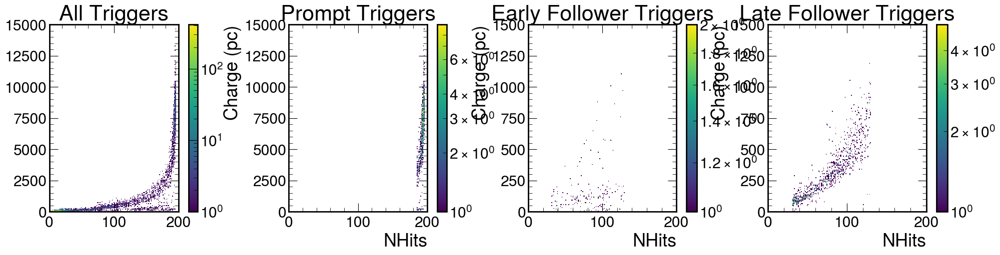

In [7]:
charge = [event.total_digit_charge_pc for event in run.events]
nhit = [event.nhits for event in run.events]

prompt_charge = [event.total_digit_charge_pc for event in run.events if event.trigger_type==0]
prompt_nhit = [event.nhits for event in run.events if event.trigger_type==0]

early_follower_charge = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us < 4]
early_follower_nhit = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us < 4]

late_follower_charge = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us >= 4]
late_follower_nhit = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us >= 4]

x = np.linspace(0,200,100)

fig, ax = plt.subplots(1,4, figsize=(15,5))
fig.tight_layout()
hep.hist2dplot(np.histogram2d(nhits, charge, bins=(200,200), range=((0,200),(0,15000))), ax=ax[0], norm='log')
ax[0].set_title("All Triggers")
#ax[0].plot(x,line(x,0.022,108,90),'-',linewidth=2,color='red')

hep.hist2dplot(np.histogram2d(prompt_nhit, prompt_charge, bins=(200,200), range=((0,200),(0,15000))), ax=ax[1], norm='log')
ax[1].set_title("Prompt Triggers")
ax[1].set_xlabel("NHits")
ax[1].set_ylabel("Charge (pc)")

hep.hist2dplot(np.histogram2d(early_follower_nhit, early_follower_charge, bins=(200,200), range=((0,200),(0,1500))), ax=ax[2], norm='log')
ax[2].set_title("Early Follower Triggers")
ax[2].set_xlabel("NHits")   
ax[2].set_ylabel("Charge (pc)")

hep.hist2dplot(np.histogram2d(late_follower_nhit, late_follower_charge, bins=(200,200), range=((0,200),(0,1500))), ax=ax[3], norm='log')
ax[3].set_title("Late Follower Triggers")
ax[3].set_xlabel("NHits")
ax[3].set_ylabel("Charge (pc)")

# Cut on nhit and charge aboce 100 nhit to isolate the three regions
# Top is prompt muons
# Bottoms is early michels
# What is middle? Late something

In [8]:
# early_total_charge = [event.total_gaussian_charge_pc for event in run.events if event.time_since_last_trigger_us<3]
# late_total_charge = [event.total_gaussian_charge_pc for event in run.events if event.time_since_last_trigger_us>3]

# ec, eb = np.histogram(early_total_charge, bins=50, range=(0,500))
# lc, lb = np.histogram(late_total_charge, bins=50, range=(0,500))
# res = lc-ec
# centers = (eb[1:]+eb[:-1])/2

# plt.hist(early_total_charge, bins=50, range=(0,500), histtype='step', label='Early - Decaying Muon');
# plt.hist(late_total_charge, bins=50, range=(0,500), histtype='step', label='Late - Crossing Muon');
# plt.plot(centers, res, label='Difference',)
# plt.legend()
# plt.yscale('log')

In [9]:
# for event in run.events:
#     event.print()

print(','.join(f"{bool}" for bool in run.pmt_is_online))


True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,True,True,True,True,False,False,True,True,False,True,True,False,False,True,True,True,False,True,True,True,True,True,True,True,False,False,True,True,True,True,True,True,True,True,True,True,True,False,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,False,False,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,False,True,True,True,True,False,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,True,True,True,True,False,True,False,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,True,T

Text(1, 0, 'Total NHits per Event')

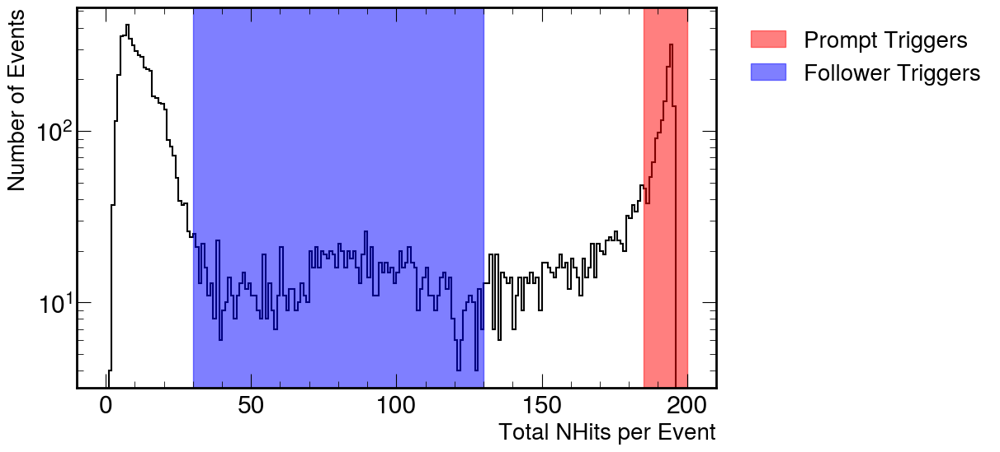

In [10]:
nhits = run.get_nhits()

plt.figure(figsize=(10, 6))
hep.histplot(np.histogram(nhits, bins=200, range=(0, 200)), color='black')
plt.axvspan(prompt_nhit_range[0], prompt_nhit_range[1], color='red', alpha=0.5, label='Prompt Triggers')
plt.axvspan(follower_nhit_range[0], follower_nhit_range[1], color='blue', alpha=0.5, label='Follower Triggers')
plt.legend(loc='upper right',bbox_to_anchor=(1.45, 1),fontsize=20)
#plt.ylim(1e3,1e5)
plt.yscale('log')
plt.ylabel('Number of Events', fontsize=20)
plt.xlabel('Total NHits per Event', fontsize=20)

1355 1355


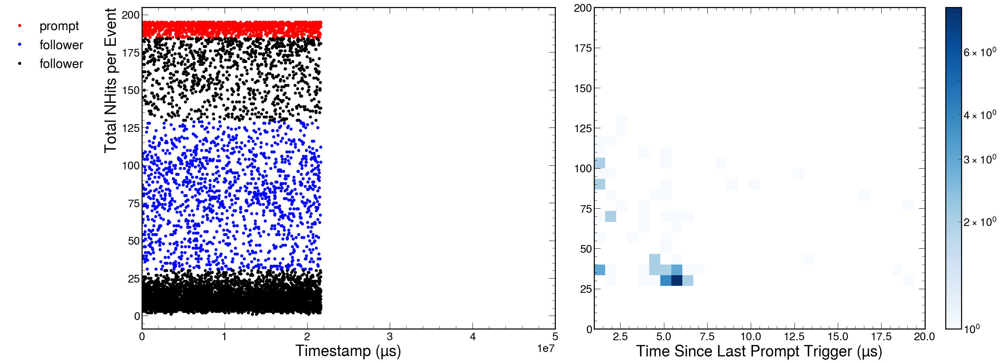

In [11]:
ts_prompt = [event.timestamp_us for event in run.events if event.trigger_type==0]
ts_follower = [event.timestamp_us for event in run.events if event.trigger_type==1]
ts_bad = [event.timestamp_us for event in run.events if event.trigger_type==None]

deltat = [event.time_since_last_trigger_us for event in run.events if event.trigger_type==1]
deltat_follower = [event.time_since_last_prompt_trigger_us for event in run.events if event.trigger_type==1]
deltat_follower_early = [event.time_since_last_prompt_trigger_us for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us < 4 and event.n_negatives<10]
print(len(deltat),len(deltat_follower))

nhits_prompt = [event.nhits for event in run.events if event.trigger_type==0]
nhits_follower = [event.nhits for event in run.events if event.trigger_type==1]
nhits_bad = [event.nhits for event in run.events if event.trigger_type==None]

fig, ax = plt.subplots(1,2,figsize=(25, 10))
fig.tight_layout()
ax[0].plot(ts_prompt, nhits_prompt, 'o', markersize=5, label='prompt', color='red')
ax[0].plot(ts_follower, nhits_follower, 'o', markersize=5, label='follower', color='blue')
ax[0].plot(ts_bad, nhits_bad, 'o', markersize=5, label='follower', color='black')
ax[0].set_xlabel('Timestamp (µs)', loc='center',fontsize=30)
ax[0].set_ylabel('Total NHits per Event', fontsize=30)
ax[0].set_xlim(0, 5e7)
ax[0].legend(loc='upper left',bbox_to_anchor=(-0.35, 1),fontsize=25)
#ax[1].plot(deltat_follower, nhits_follower, 'o', markersize=5, label='follower', color='blue')
hd = ax[1].hist2d(deltat_follower, nhits_follower, bins=(30, 30), range=((1, 20), (0,200)),norm='log', cmap='Blues')
ax[1].set_xlabel('Time Since Last Prompt Trigger (µs)', loc='center', fontsize=30)
ax[1].set_xlim(1,20)
#ax[1].set_ylim(follower_nhit_range[0], follower_nhit_range[1])  
fig.colorbar(hd[3],ax=ax[1])
#ax[2].plot(deltat, nhits_follower, 'o', markersize=5, label='follower', color='blue')
# hdf = ax[2].hist2d(deltat, nhits_follower, bins=(19, 20), range=((1, 20), (0, 200)), cmap='Blues')
# ax[2].set_xlabel('Time since last trigger (us)', fontsize=20)
# ax[2].set_xlim(1,20)
# fig.colorbar(hdf[3],ax=ax[2])

(array([8., 4., 5., 0., 1., 3., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.]),
 array([ 1.   ,  1.475,  1.95 ,  2.425,  2.9  ,  3.375,  3.85 ,  4.325,
         4.8  ,  5.275,  5.75 ,  6.225,  6.7  ,  7.175,  7.65 ,  8.125,
         8.6  ,  9.075,  9.55 , 10.025, 10.5  , 10.975, 11.45 , 11.925,
        12.4  , 12.875, 13.35 , 13.825, 14.3  , 14.775, 15.25 , 15.725,
        16.2  , 16.675, 17.15 , 17.625, 18.1  , 18.575, 19.05 , 19.525,
        20.   ]),
 <BarContainer object of 40 artists>)

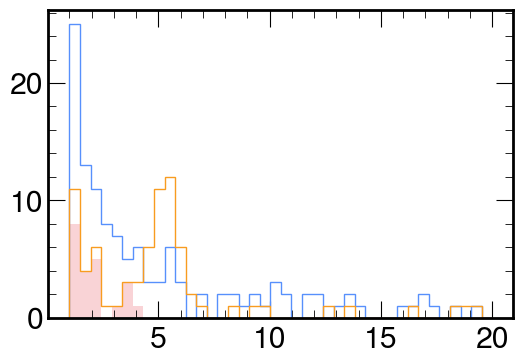

In [12]:
plt.figure(figsize=(6, 4))
plt.hist(deltat, bins=40, range=(1, 20), histtype='step', label='Follower')
plt.hist(deltat_follower, bins=40, range=(1, 20), histtype='step', label='Follower');
plt.hist(deltat_follower_early, bins=40, range=(1,20),alpha=0.2)

In [13]:

def fit_decay_hist(data,bins=19,range=(0.5,20.5),tau_guess=2):

    bins=19

    counts, bin_edges = np.histogram(data, bins=bins, range=range)
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    
    sigma = np.sqrt(counts)

    def decay_model(t, A, tau, B):
        return (A / tau) * np.exp(-t / tau) + B
    
    # Initial guess for the parameters
    A_guess = np.max(counts) * (range[1] - range[0]) / bins
    B_guess = np.min(counts)
    p0 = [A_guess, tau_guess, B_guess]

    popt, pcov = curve_fit(decay_model, bin_centers, counts, sigma=sigma, absolute_sigma=True, p0=p0, maxfev=100000) 

    A_fit, tau_fit, B_fit = popt
    A_err, tau_err, B_err = np.sqrt(np.diag(pcov))

    residuals = counts - decay_model(bin_centers, *popt)
    chi2 = np.sum((residuals / sigma) ** 2)
    dof = len(counts) - len(popt)
    chi2_red = chi2 / dof

    print("Fit results:")
    print(f"A = {A_fit:.3f} ± {A_err:.3f}")
    print(f"tau = {tau_fit:.3f} ± {tau_err:.3f}")
    print(f"B = {B_fit:.3f} ± {B_err:.3f}")
    print(f"Chi2 = {chi2:.3f}")
    print(f"Chi2/dof = {chi2_red:.3f}")

    plt.figure(figsize=(10, 6))
    plt.errorbar(bin_centers, counts, yerr=sigma, fmt='o', color='black', label='Data')
    t_fine = np.linspace(*range, 1000)
    plt.plot(t_fine, decay_model(t_fine, *popt), color='red', label=fr'WLS Fit: $\tau$ = {tau_fit:.3f} +/- {tau_err:.3f} µs')
    plt.xlabel('$\Delta$T (µs)', fontsize=20)
    plt.ylabel(f"Counts / {(range[-1]-range[0])/bins:.3f} µs",fontsize=20)
    plt.title(f" $\Delta$T = Time Since Last Prompt Trigger",fontsize=20)
    plt.grid(True)
    #plt.yscale('log')
    #plt.axvspan(0.5,3, color='blue', alpha=0.5, label='Selected Events')
    plt.legend(fontsize=15)
    plt.show()
    

#deltat_follower = [event.time_since_last_prompt_trigger_us for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<10]
fit_decay_hist(deltat_follower)



/home/bharris/.conda/envs/mypythonenv/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:968: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.

In [14]:
total_digit_charge_pc = [event.total_digit_charge_pc for event in run.events if event.trigger_type!=None] 
total_log_charge_pc = [event.total_log_charge_pc for event in run.events if event.trigger_type!=None]
total_gaussian_charge_pc = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type!=None]

print(len(total_log_charge_pc),len(total_digit_charge_pc), len(total_gaussian_charge_pc))
print(total_digit_charge_pc[0])
print(total_log_charge_pc[0])
print(total_digit_charge_pc[0])

2710 2710 2710
350.78125
231.8203163528006
350.78125


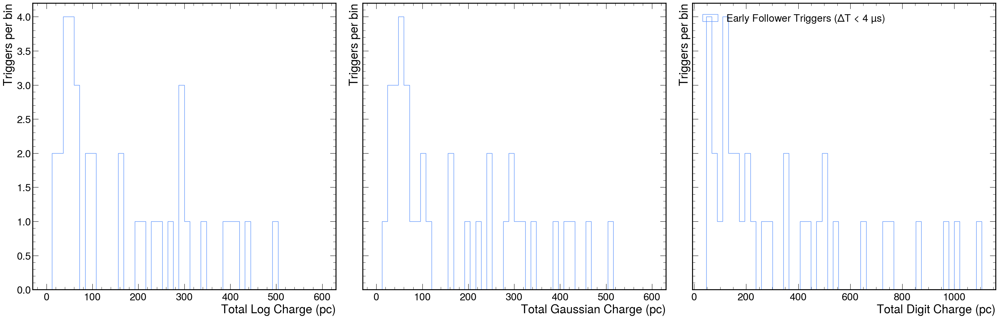

In [15]:
fig, ax = plt.subplots(1,3,figsize=(30, 10),sharey=True,tight_layout=True)
fontsize = 25
bins=50
upper_charge=1500
nneg=10
#log_bins = np.logspace(np.log10(1),np.log10(upper_charge), bins)

total_log_charge_pc_follower_early = [event.total_log_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives<10]
total_log_charge_pc_follower_late = [event.total_log_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us>4]
total_log_charge_pc_prompt = [event.total_log_charge_pc for event in run.events if event.trigger_type==0]

ax[0].hist(total_log_charge_pc_follower_early, bins=bins, range=(0,600), histtype='step', label='Early Follower Triggers ($\Delta$T < 4 µs)');
#ax[0].hist(total_log_charge_pc_follower_late, bins=bins, range=(0,upper_charge), histtype='step', label='Late Follower Triggers ($\Delta$T > 4 µs)');
#ax[0].hist(total_log_charge_pc_prompt, bins=bins, range=(0,upper_charge), histtype='step', label='All Prompt Triggers');
ax[0].set_xlabel('Total Log Charge (pc)', fontsize=fontsize)
ax[0].set_ylabel('Triggers per bin', fontsize=fontsize)
#ax[0].set_xscale('log')
#ax[0].set_yscale('log')
#ax[0].set_xlim(3e1,1e4)
# ax[0].set_ylim(0,50)
#ax[0].legend()

total_gaussian_charge_pc_follower_early = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives<10]
total_gaussian_charge_pc_follower_late = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us>4]
total_gaussian_charge_pc_prompt = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type==0]

ax[1].hist(total_gaussian_charge_pc_follower_early, bins=bins, range=(0,600), histtype='step', label='Early Follower Triggers ($\Delta$T < 4 µs)');
#ax[1].hist(total_gaussian_charge_pc_follower_late, bins=bins, range=(0,upper_charge), histtype='step', label='Late Follower Triggers ($\Delta$T > 4 µs)');
#ax[1].hist(total_gaussian_charge_pc_prompt, bins=bins, range=(0,upper_charge), histtype='step', label='All Prompt Triggers');
ax[1].set_xlabel('Total Gaussian Charge (pc)', fontsize=fontsize)
ax[1].set_ylabel('Triggers per bin', fontsize=fontsize)
#ax[1].set_xscale('log')
#ax[1].set_yscale('log')
#ax[1].set_xlim(3e1,1e4)
# ax[1].set_ylim(0,50)
#ax[1].legend()

total_digit_charge_pc_follower_early = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives<10]
total_digit_charge_pc_follower_late = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us>4]
total_digit_charge_pc_prompt = [event.total_digit_charge_pc for event in run.events if event.trigger_type==0]

ax[2].hist(total_digit_charge_pc_follower_early, bins=bins, histtype='step', label='Early Follower Triggers ($\Delta$T < 4 µs)');
#ax[2].hist(total_digit_charge_pc_follower_late, bins=bins, range=(0,upper_charge), histtype='step', label='Late Follower Triggers ($\Delta$T > 4 µs)');
#ax[2].hist(total_digit_charge_pc_prompt, bins=bins, range=(0,upper_charge), histtype='step', label='All Prompt Triggers');
ax[2].set_xlabel('Total Digit Charge (pc)', fontsize=fontsize)
ax[2].set_ylabel('Triggers per bin', fontsize=fontsize)
#ax[2].set_xlim(3e1,2e4)
#ax[2].set_xscale('log')
#ax[2].set_yscale('log')
# ax[2].set_ylim(0,50)
ax[2].legend(loc='upper left')

Max:11.15 Avg:-0.43 Std:2.33


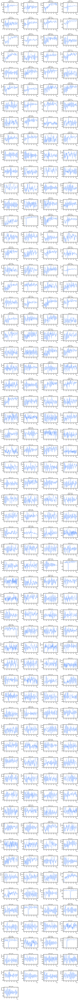

In [19]:

test = [event for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives>10]

def plot_event_waveforms(event_id, events, columns=4):
  
    event = events[event_id]  # Get the event by ID
    waveforms = event.waveforms
    charges = event.digit_charge_pc
    charge_ids = event.digit_pmt_id
    # print(len(charge_ids),": ",charge_ids)
    # print(len(waveforms))

    rows = (len(waveforms) + columns - 1) // columns  # Calculate the number of rows

    waveforms = waveforms*0.1342-1100

    max_charge=np.max(charges)
    avg_charge=np.average(charges)
    std_charge=np.std(charges)
    print(f"Max:{max_charge:.2f} Avg:{avg_charge:.2f} Std:{std_charge:.2f}")
    
    fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 3))
    axes = axes.flatten()  # Flatten the axes for easy indexing

    fontsize=10
    for i, wf in enumerate(waveforms):
        axes[i].plot(wf)
        charge_value=None
        if i in charge_ids:
            charge_index = ak.where(charge_ids==i)
            charge_value = charges[charge_index]
        else:
            charge_value = None
        # else:
        #     print(f"{i} is not in {charge_ids}")
        title = f"PMT ID: {i}"
        if charge_value is not None:
            title += f"\nCharge: {charge_value[0]:.2f} pC"
        axes[i].set_title(title,fontsize=fontsize)
        axes[i].set_xlabel("Time",fontsize=fontsize)
        axes[i].set_ylabel("Amplitude",fontsize=fontsize)
        axes[i].tick_params(axis='both', which='major', labelsize=fontsize)  # Update tick label font size
        axes[i].tick_params(axis='both', which='minor', labelsize=fontsize)


    # Hide unused subplots
    for j in range(len(waveforms), len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

# Example usage
plot_event_waveforms(event_id=0, events=test, columns=4)



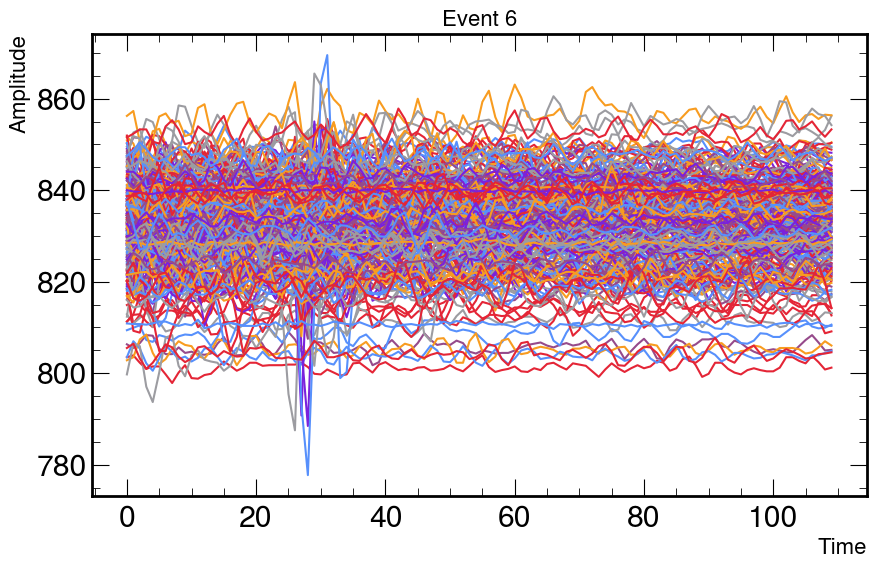

In [20]:
test = [event for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives>10]

def plot_event_waveforms_together(event_id, events):

    event = events[event_id]  # Get the event by ID
    plt.figure(figsize=(10,6))
    for waveform in event.waveforms:
        waveform=waveform*0.1342-1100
        plt.plot(waveform)
    fontsize=16
    plt.title(f"Event {event_id}", fontsize=fontsize)
    plt.xlabel("Time", fontsize=fontsize)
    plt.ylabel("Amplitude", fontsize=fontsize)
    plt.show()

# Example usage
plot_event_waveforms_together(event_id=6, events=test)

In [ ]:

for event in test:
    waveforms = event.waveforms
    charges = event.digit_charge_pc
    charge_ids = event.digit_pmt_id
    negs = event.n_negatives

    max_charge=np.max(charges)
    avg_charge=np.average(charges)
    std_charge=np.std(charges)
    print(f"NN:{negs} Max:{max_charge:.2f} Avg:{avg_charge:.2f} Std:{std_charge:.2f}")


NN:11 Max:88.10 Avg:9.48 Std:19.49
NN:12 Max:118.39 Avg:5.19 Std:14.47
NN:21 Max:199.89 Avg:5.56 Std:21.83
NN:11 Max:215.20 Avg:7.40 Std:25.88
NN:14 Max:121.73 Avg:7.22 Std:19.78
NN:12 Max:150.79 Avg:5.58 Std:20.33
NN:11 Max:88.93 Avg:5.86 Std:12.67
NN:12 Max:220.75 Avg:6.31 Std:25.66


(array([[0., 0., 0., ..., 3., 1., 2.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 1., 1., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.]]),
 array([-181.34521484, -153.11254883, -124.87988281,  -96.6472168 ,
         -68.41455078,  -40.18188477,  -11.94921875,   16.28344727,
          44.51611328,   72.7487793 ,  100.98144531,  129.21411133,
         157.44677734,  185.67944336,  213.91210938,  242.14477539,
         270.37744141,  298.61010742,  326.84277344,  355.07543945,
         383.30810547,  411.54077148,  439.7734375 ,  468.00610352,
         496.23876953,  524.47143555,  552.70410156,  580.93676758,
         609.16943359,  637.40209961,  665.63476562,  693.86743164,
         722.10009766,  750.33276367,  778.56542969,  806.7980957 ,
         835.03076172,  863.26342773,  891.49609375,  919.72875977,
         947.96142578,  976.1940918 , 1004.42675781, 1032.65942383,
   

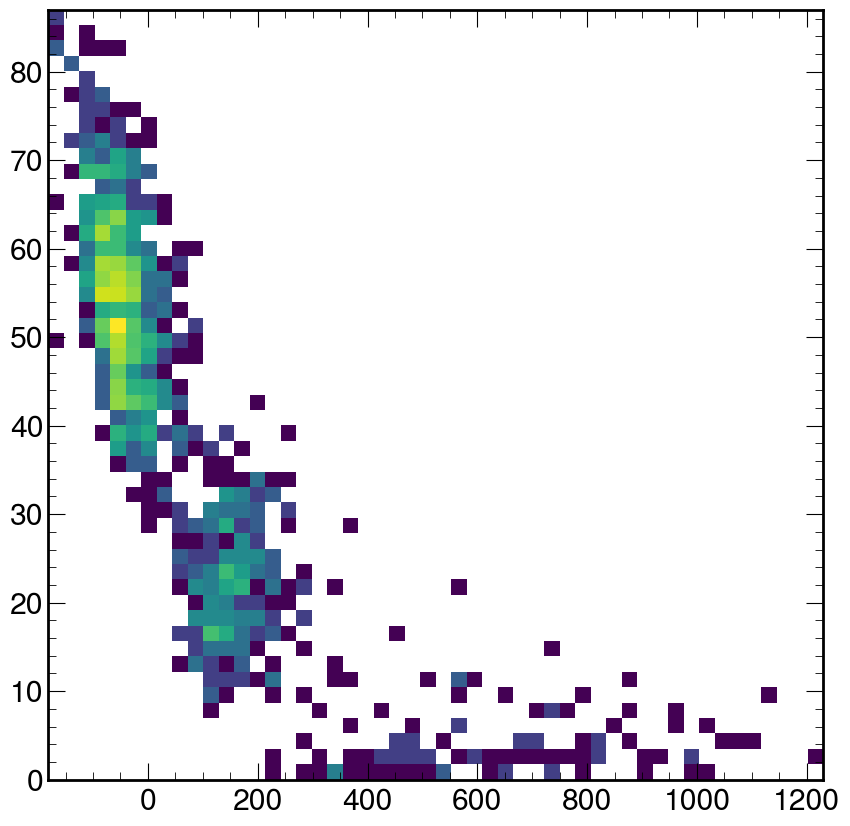

In [ ]:
tcharges = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4]
tnegs = [event.n_negatives for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4]

plt.hist2d(tcharges,tnegs,bins=(50,50),norm='log')


1541
81 [8.58, 1.61, 1.67, 2.78, 6.37, 2.6, ..., 6.59, 1.82, 1.39, 1.72, 1.65, 0.962]
80 [-0.195, 0.465, -0.0635, -2.83, -0.981, ..., 0.21, -0.729, 0.42, -0.708, -0.464]
[-0.195, 0.465, -0.0635, -2.83, -0.981, ..., 0.21, -0.729, 0.42, -0.708, -0.464]


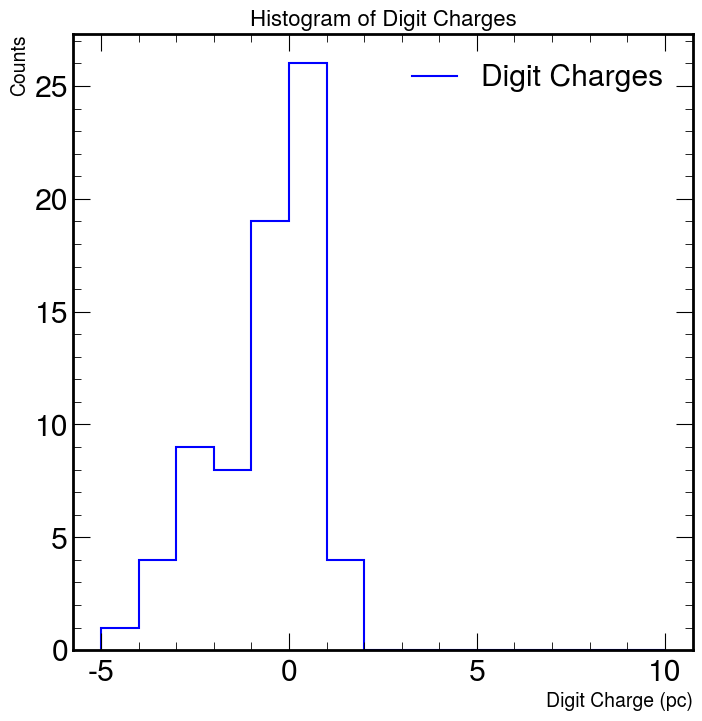

-0.13844445633561955


In [ ]:

digits = [event.digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us <4]

print(len(digits))
print(len(digits[3]),digits[0])
print(len(digits[2]),digits[1])

fds = digits[1]
print(fds)

import matplotlib.pyplot as plt
import mplhep as hep
import numpy as np

# Assuming `fds` is your data
counts, bin_edges = np.histogram(fds, bins=15,range=(-5,10))

# Plot the histogram
plt.figure(figsize=(8, 8))
hep.histplot(counts, bins=bin_edges, color='blue', label='Digit Charges')
plt.xlabel('Digit Charge (pc)', fontsize=14)
plt.ylabel('Counts', fontsize=14)
plt.title('Histogram of Digit Charges', fontsize=16)
plt.legend()
plt.show()
print(np.mean(fds))

304 304


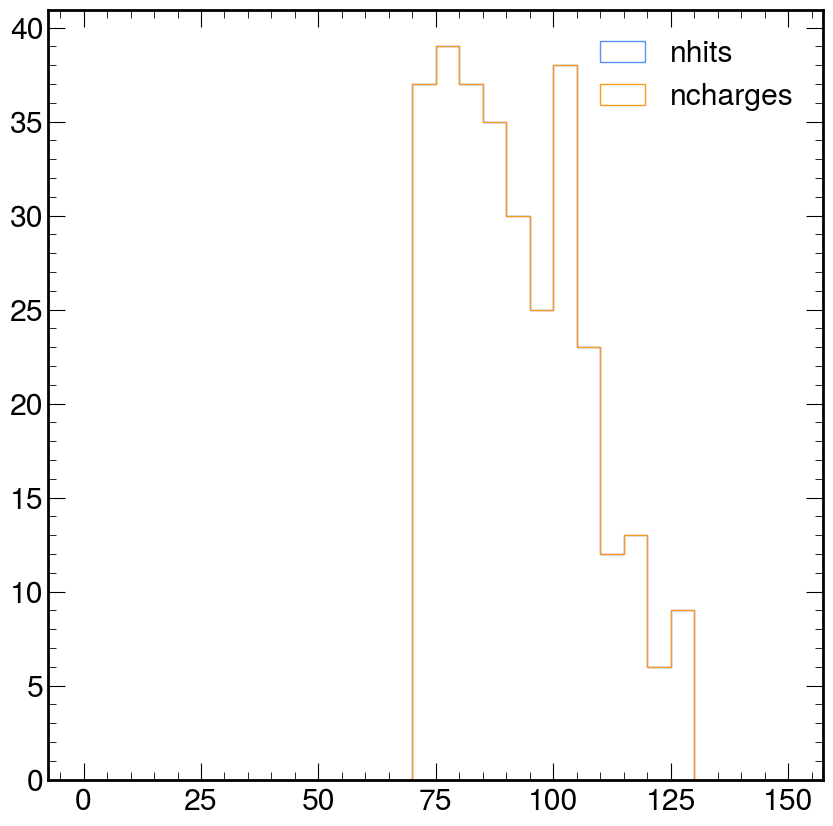

In [ ]:
nhits = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us < 4]
charges = [event.digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us < 4]

print(len(nhits),len(charges))

ncharges = []
for c in charges:
    ncharges.append(len(c))

plt.hist(nhits,bins=30,range=(0,150),histtype='step',label='nhits')
plt.hist(ncharges,bins=30,range=(0,150),histtype='step',label='ncharges')
plt.legend()

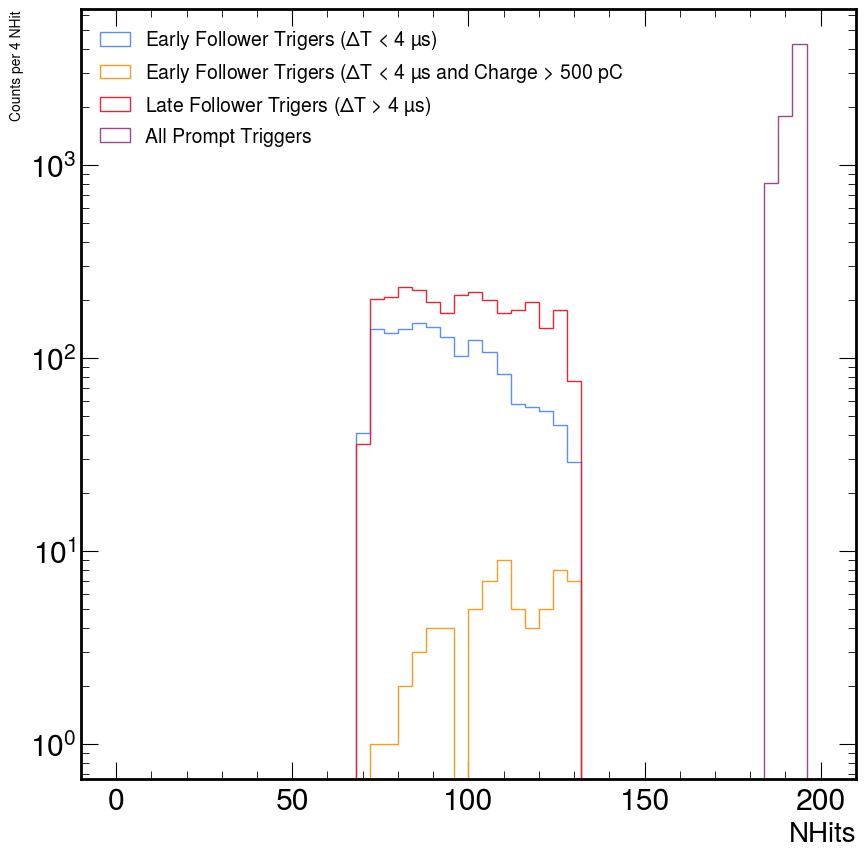

In [ ]:

nhit_follower_early = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4]
nhit_follower_early_charge = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.total_digit_charge_pc>500]
nhit_follower_late = [event.nhits for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us>4]
#nhit_follower_wierd = [event.nhits for event in run.events if event.trigger_type==1 and 8>event.time_since_last_prompt_trigger_us>3]
nhit_prompt = [event.nhits for event in run.events if event.trigger_type==0]

#plt.hist(total_log_charge_pc_follower, bins=50, range=(0,500), histtype='step', label='Follower');
plt.hist(nhit_follower_early, bins=50, range=(0,200), histtype='step', label='Early Follower Trigers ($\Delta$T < 4 µs)');
plt.hist(nhit_follower_early_charge, bins=50, range=(0,200), histtype='step', label='Early Follower Trigers ($\Delta$T < 4 µs and Charge > 500 pC');
plt.hist(nhit_follower_late, bins=50, range=(0,200), histtype='step', label='Late Follower Trigers ($\Delta$T > 4 µs)');
#plt.hist(nhit_follower_wierd, bins=50, range=(0,200), histtype='step', label='Follower Wierd');
plt.hist(nhit_prompt, bins=50, range=(0,200), histtype='step', label='All Prompt Triggers');
plt.xlabel('NHits', fontsize=20)
plt.ylabel('Counts per 4 NHit', fontsize=10)
plt.legend(loc='upper left',fontsize=14)
plt.yscale('log')

In [ ]:
# xquad = [event.xquad for event in run.events if event.xquad > -5000]
# yquad = [event.yquad for event in run.events if event.yquad > -5000]
# zquad = [event.zquad for event in run.events if event.zquad > -5000]


# fig,ax=plt.subplots(1,3,figsize=(15,5))
# ax[0].hist(xquad,bins=100)
# ax[1].hist(yquad,bins=100)
# ax[2].hist(zquad,bins=100)

18 groups


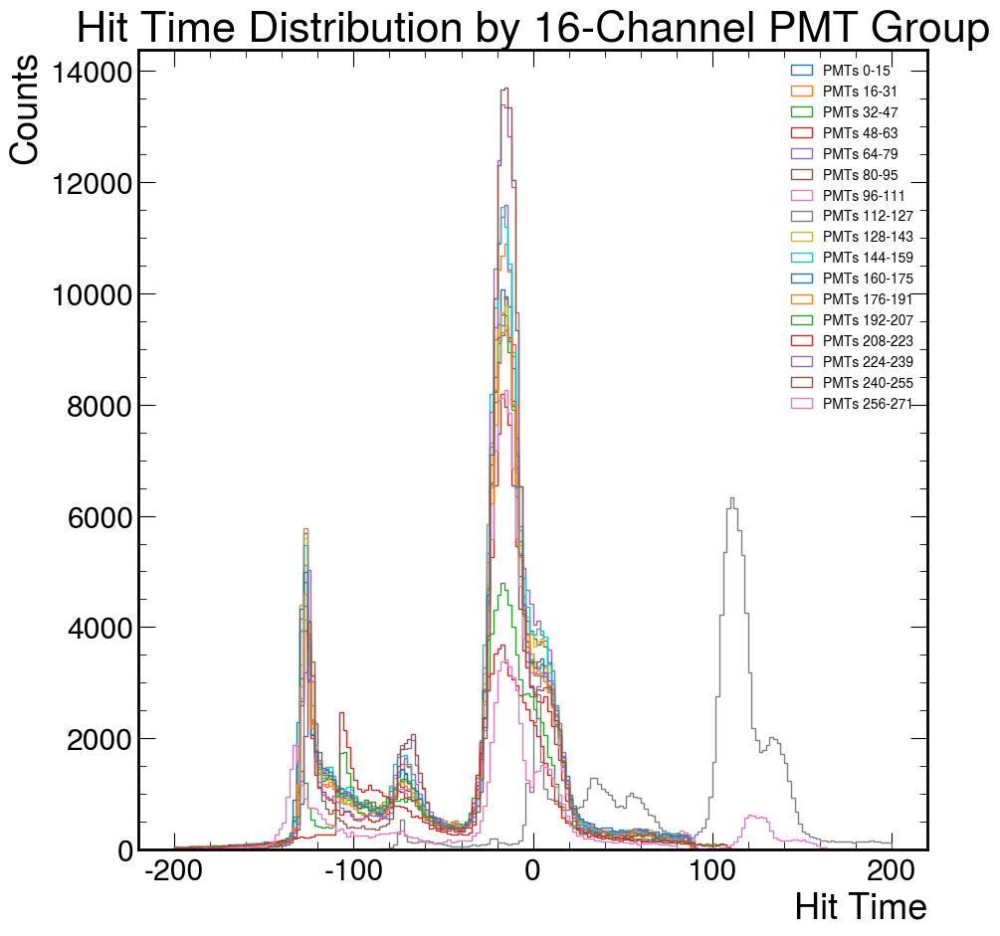

In [ ]:
id2ch = dict(zip(run.pmt_id, run.pmt_ch))
ch2id = dict(zip(run.pmt_ch, run.pmt_id))

grouped_hit_times = {}

for event in run.events:
    for pmt_id, time in zip(event.digit_pmt_id, event.digit_time_ns):
        if True: #run.pmt_is_online[pmt_id]:#and -30<time<10:
            group = id2ch[pmt_id] // 16
            if group not in grouped_hit_times:
                grouped_hit_times[group] = []
            grouped_hit_times[group].append(time)

# Convert to NumPy array if needed
for group in grouped_hit_times:
    grouped_hit_times[group] = np.array(grouped_hit_times[group])

plt.figure(figsize=(10, 10))

colors = plt.cm.tab10.colors  # color palette
for i, (group, times) in enumerate(sorted(grouped_hit_times.items())):
    plt.hist(times, bins=200, range=(-200,200), histtype='step', label=f'PMTs {group*16}-{group*16+15}', color=colors[i % len(colors)])

plt.xlabel('Hit Time')
plt.ylabel('Counts')
plt.legend(fontsize=10)
plt.title('Hit Time Distribution by 16-Channel PMT Group')
plt.tight_layout()

print(f"{len(grouped_hit_times)+1} groups")


plt.show()




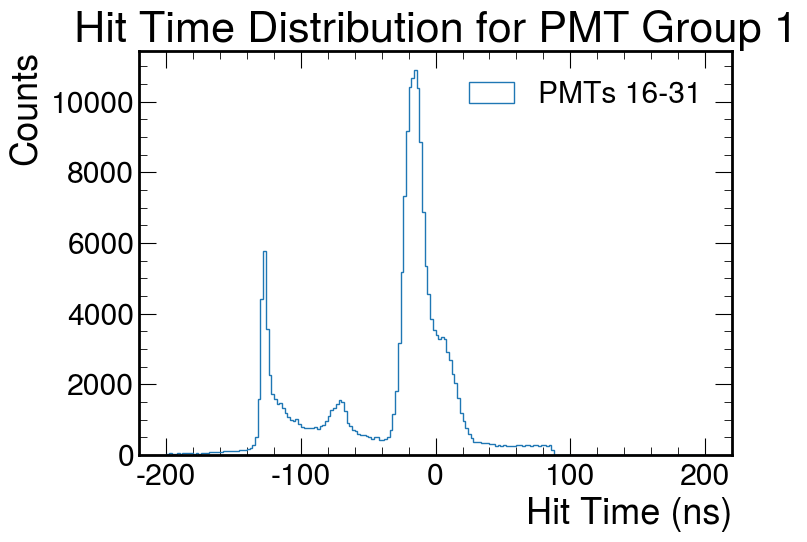

In [ ]:

group_to_plot = 1 # Change this to whichever group you want

if group_to_plot in grouped_hit_times:
    plt.figure(figsize=(8, 6))
    times = grouped_hit_times[group_to_plot]
    plt.hist(times, bins=200, range=(-200, 200), histtype='step', 
             label=f'PMTs {group_to_plot*16}-{group_to_plot*16+15}',
             color='tab:blue')
    
    plt.xlabel('Hit Time (ns)')
    plt.ylabel('Counts')
    plt.title(f'Hit Time Distribution for PMT Group {group_to_plot}')
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print(f"Group {group_to_plot} not found in data.")


In [ ]:

channel_hit_times = {}

for event in run.events:
    for pmt_id, time in zip(event.digit_pmt_id, event.digit_time_ns):
        # Can do sorting here. Should really put back into class
        if True:#-500<event.xquad<500 and -500<event.yquad<500 and -500<event.zquad<500:
            channel = id2ch[pmt_id] 
            if channel not in channel_hit_times:
                channel_hit_times[channel] = []
            channel_hit_times[channel].append(time)

# Convert to NumPy array if needed
for channel in channel_hit_times:
    channel_hit_times[channel] = np.array(channel_hit_times[channel])

# plt.figure(figsize=(10, 10))

# colors = plt.cm.tab10.colors  # color palette
# for i, (channel, times) in enumerate(sorted(channel_hit_times.items())):
#     plt.hist(times, bins=200, range=(-200,200), histtype='step', label=f'PMTs {channel}', color=colors[i % len(colors)])

# plt.xlabel('Hit Time')
# plt.ylabel('Counts')
# #plt.legend()
# plt.title('Hit Time Distribution by PMT')
# plt.tight_layout()
# plt.show()




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


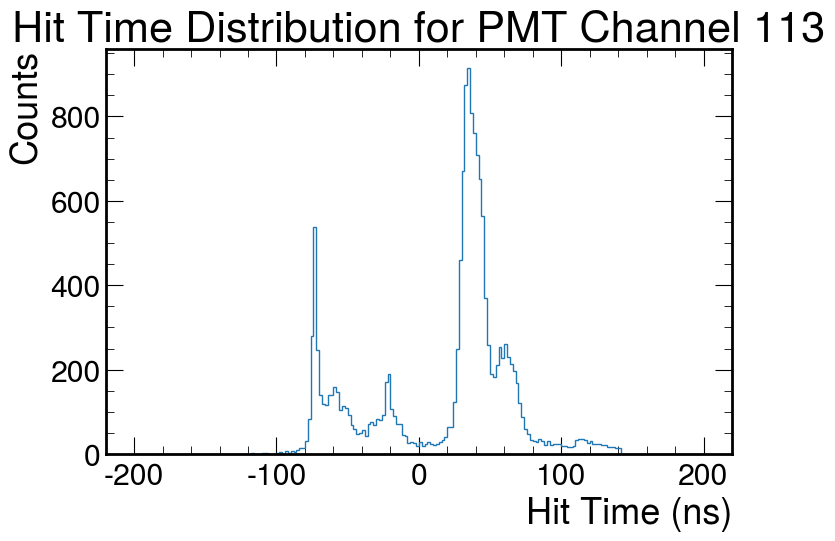

In [ ]:
id2ch = dict(zip(run.pmt_id, run.pmt_ch))
ch2id = dict(zip(run.pmt_ch, run.pmt_id))

channel_to_plot =113 # Change this to whichever group you want

if channel_to_plot in channel_hit_times:
    plt.figure(figsize=(8, 6))
    times = channel_hit_times[channel_to_plot]
    plt.hist(times, bins=200, range=(-200, 200), histtype='step',
             color='tab:blue')
    
    plt.xlabel('Hit Time (ns)')
    plt.ylabel('Counts')
    plt.title(f'Hit Time Distribution for PMT Channel {channel_to_plot}')
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print(f"Channel {channel_to_plot} not found in data.")
    print(f"Channel Online: {run.pmt_is_online[ch2id[channel_to_plot]]}")

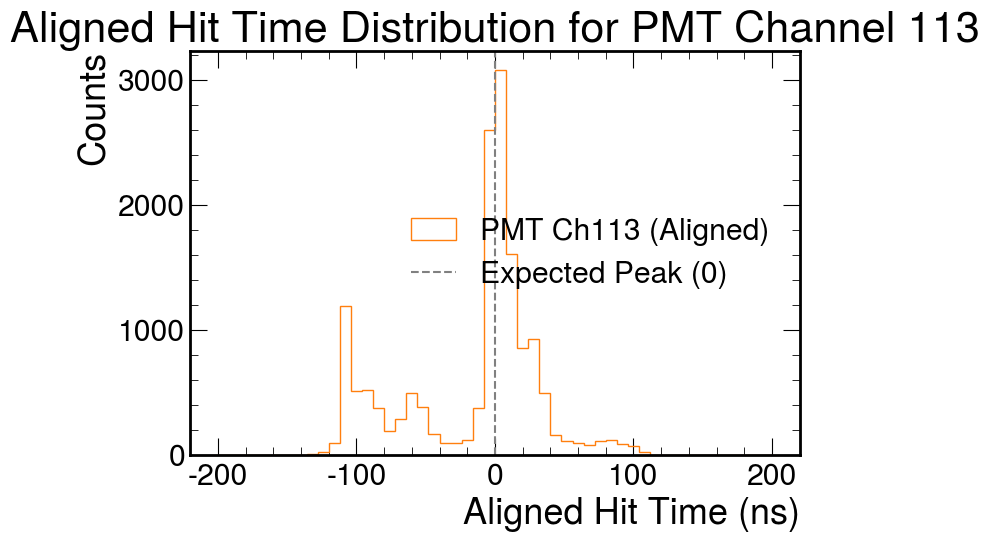

dict_keys([np.int32(224), np.int32(226), np.int32(113), np.int32(227), np.int32(230), np.int32(231), np.int32(232), np.int32(233), np.int32(234), np.int32(235), np.int32(241), np.int32(242), np.int32(243), np.int32(244), np.int32(119), np.int32(245), np.int32(246), np.int32(247), np.int32(249), np.int32(250), np.int32(258), np.int32(261), np.int32(267), np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(13), np.int32(14), np.int32(22), np.int32(24), np.int32(26), np.int32(32), np.int32(33), np.int32(37), np.int32(41), np.int32(42), np.int32(46), np.int32(54), np.int32(58), np.int32(65), np.int32(66), np.int32(70), np.int32(71), np.int32(75), np.int32(76), np.int32(77), np.int32(188), np.int32(80), np.int32(81), np.int32(83), np.int32(85), np.int32(86), np.int32(93), np.int32(96), np.int32(98), np.int32(100), np.int32(102), np.int32(103), np.int32(105), np.int32(106), np.int32(190), np.int32(133), np.int32(135), np.int32(138), np.int32(139), np.int32(140), np.int32(141), np.in

In [ ]:
cable_delays = {}  # Dictionary to store delay per PMT
aligned_channel_hit_times = {}  # Store corrected hit times

def compute_cable_delays(channel_hit_times, bins=200, range=(-200, 200)):
    for pmt_ch, times in channel_hit_times.items():
        # Compute histogram
        counts, bin_edges = np.histogram(times, bins=bins, range=range)
        
        # Find the bin with the max count
        max_bin_index = np.argmax(counts)
        
        # Compute the center of that bin
        bin_center = 0.5 * (bin_edges[max_bin_index] + bin_edges[max_bin_index + 1])
        
        # Store delay
        cable_delays[pmt_ch] = bin_center
        
        # Apply delay correction to hit times
        aligned_channel_hit_times[pmt_ch] = times - bin_center

    return cable_delays

compute_cable_delays(channel_hit_times)

# Plot an aligned histogram to verify peak is at 0
def plot_aligned_channel(pmt_ch):
    if pmt_ch in aligned_channel_hit_times:
        plt.figure(figsize=(8, 6))
        times = aligned_channel_hit_times[pmt_ch]
        plt.hist(times, bins=50, range=(-200, 200), histtype='step', 
                 label=f'PMT Ch{pmt_ch} (Aligned)', color='tab:orange')
        plt.xlabel('Aligned Hit Time (ns)')
        plt.ylabel('Counts')
        plt.title(f'Aligned Hit Time Distribution for PMT Channel {pmt_ch}')
        plt.axvline(0, color='gray', linestyle='--', label='Expected Peak (0)')
        plt.legend()
        plt.tight_layout()
        # plt.yscale('log')
        plt.show()
    else:
        print(f"PMT {pmt_ch} not found in aligned data.")

# Try it
plot_aligned_channel(113)

print(cable_delays.keys())



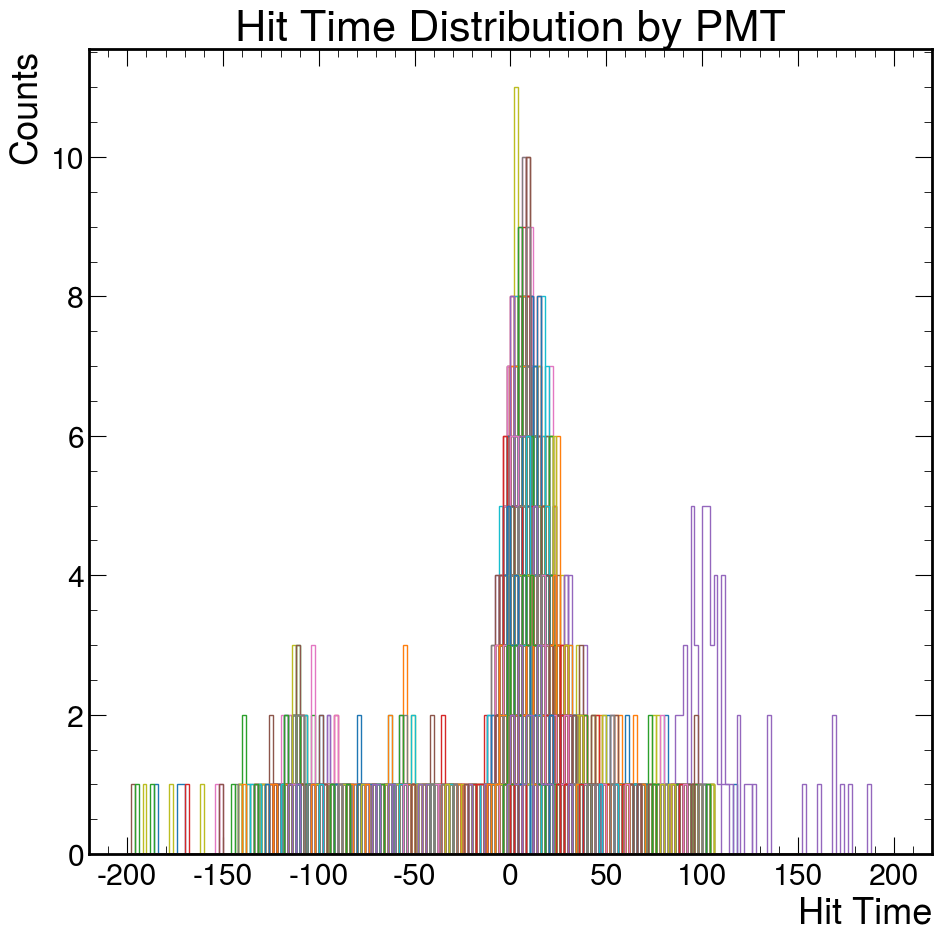

In [ ]:
michels = [event for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.n_negatives<10]

corrected_channel_hit_times = {}

for event in michels:
    for pmt_id, time in zip(event.digit_pmt_id, event.digit_time_ns):
        # Can do sorting here. Should really put back into class
        if True:#-500<event.xquad<500 and -500<event.yquad<500 and -500<event.zquad<500:
            channel = id2ch[pmt_id] 
            if channel not in corrected_channel_hit_times:
                corrected_channel_hit_times[channel] = []
            if channel not in cable_delays:
                print(f"Channel {channel} not found in cable delays")
                cable_delays[channel] = 0
            corrected_channel_hit_times[channel].append(time-cable_delays[channel])

# Convert to NumPy array if needed
for channel in corrected_channel_hit_times:
    corrected_channel_hit_times[channel] = np.array(corrected_channel_hit_times[channel])

plt.figure(figsize=(10, 10))

colors = plt.cm.tab10.colors  # color palette
for i, (channel, times) in enumerate(sorted(corrected_channel_hit_times.items())):
    plt.hist(times, bins=200, range=(-200,200), histtype='step', label=f'PMTs {channel}', color=colors[i % len(colors)])

plt.xlabel('Hit Time')
plt.ylabel('Counts')
#plt.legend()
plt.title('Hit Time Distribution by PMT')
plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


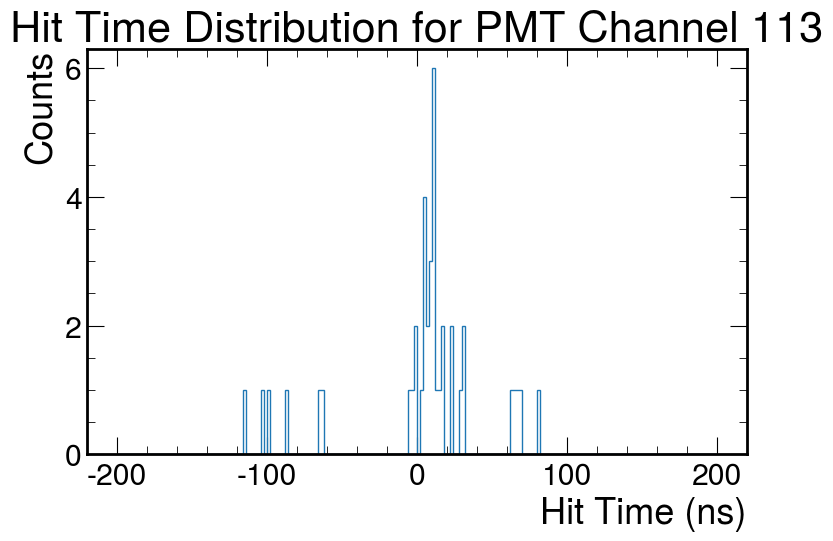

In [ ]:
id2ch = dict(zip(run.pmt_id, run.pmt_ch))
ch2id = dict(zip(run.pmt_ch, run.pmt_id))

channel_to_plot =113 # Change this to whichever group you want

if channel_to_plot in corrected_channel_hit_times:
    plt.figure(figsize=(8, 6))
    times = corrected_channel_hit_times[channel_to_plot]
    plt.hist(times, bins=200, range=(-200, 200), histtype='step',
             color='tab:blue')
    
    plt.xlabel('Hit Time (ns)')
    plt.ylabel('Counts')
    plt.title(f'Hit Time Distribution for PMT Channel {channel_to_plot}')
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print(f"Channel {channel_to_plot} not found in data.")
    print(f"Channel Online: {run.pmt_is_online[ch2id[channel_to_plot]]}")

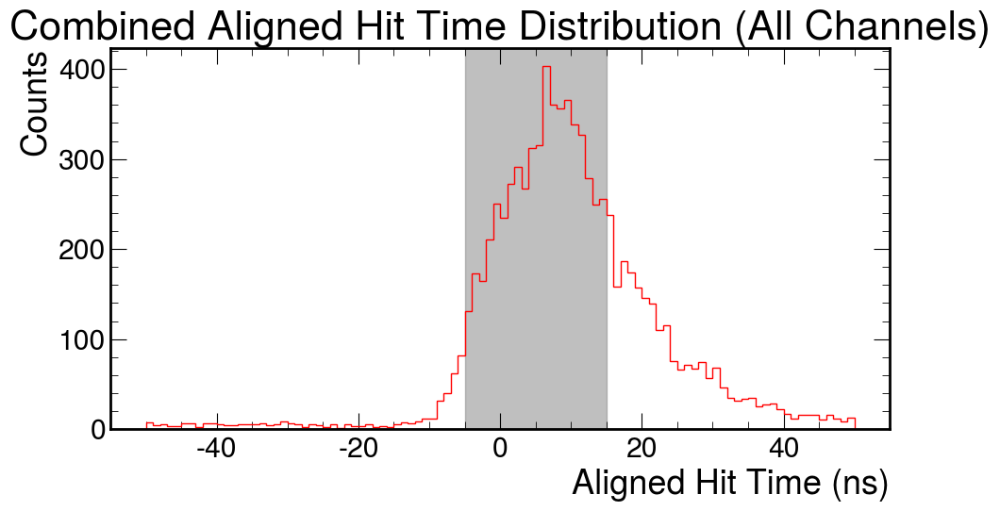

In [ ]:


# Combine all aligned times into one array
all_corrected_times = np.concatenate(list(corrected_channel_hit_times.values()))

# Plot the combined histogram
plt.figure(figsize=(10, 6))
plt.hist(all_corrected_times, bins=100, range=(-50, 50), histtype='step', edgecolor='red')
plt.axvspan(-5,15,color='grey',alpha=0.5)
plt.xlabel('Aligned Hit Time (ns)')
plt.ylabel('Counts')
plt.title('Combined Aligned Hit Time Distribution (All Channels)')
plt.tight_layout()
plt.show()



In [ ]:

# Define PMT channels
barrel_boards = [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11]
barrel_channels = [16 * board + i for board in barrel_boards for i in range(16)]


special_channels = np.arange(0, 36, 1)

top_boards =  [12, 13]
top_channels = [16 * board + i for board in top_boards for i in range(16)]

dichroic_boards = [7]
dichroic_channels = [16 * board + i for board in dichroic_boards for i in range(16)]

bottom_boards = [14, 15]
bottom_channels = [16 * board + i for board in bottom_boards for i in range(16)]

behind_boards = [16]
behind_channels = [16 * board + i for board in behind_boards for i in range(13)]

# Create channel to ID mapping
ch2id = dict(zip(run.pmt_ch, run.pmt_id))

# Convert channel lists to ID lists
barrel_ids = [ch2id[ch] for ch in barrel_channels if ch in ch2id]
bottom_ids = [ch2id[ch] for ch in bottom_channels if ch in ch2id]
dichroic_ids = [ch2id[ch] for ch in dichroic_channels if ch in ch2id]
special_ids = [ch2id[ch] for ch in special_channels if ch in ch2id]
top_ids = [ch2id[ch] for ch in top_channels if ch in ch2id]
behind_ids = [ch2id[ch] for ch in behind_channels if ch in ch2id]


268
92


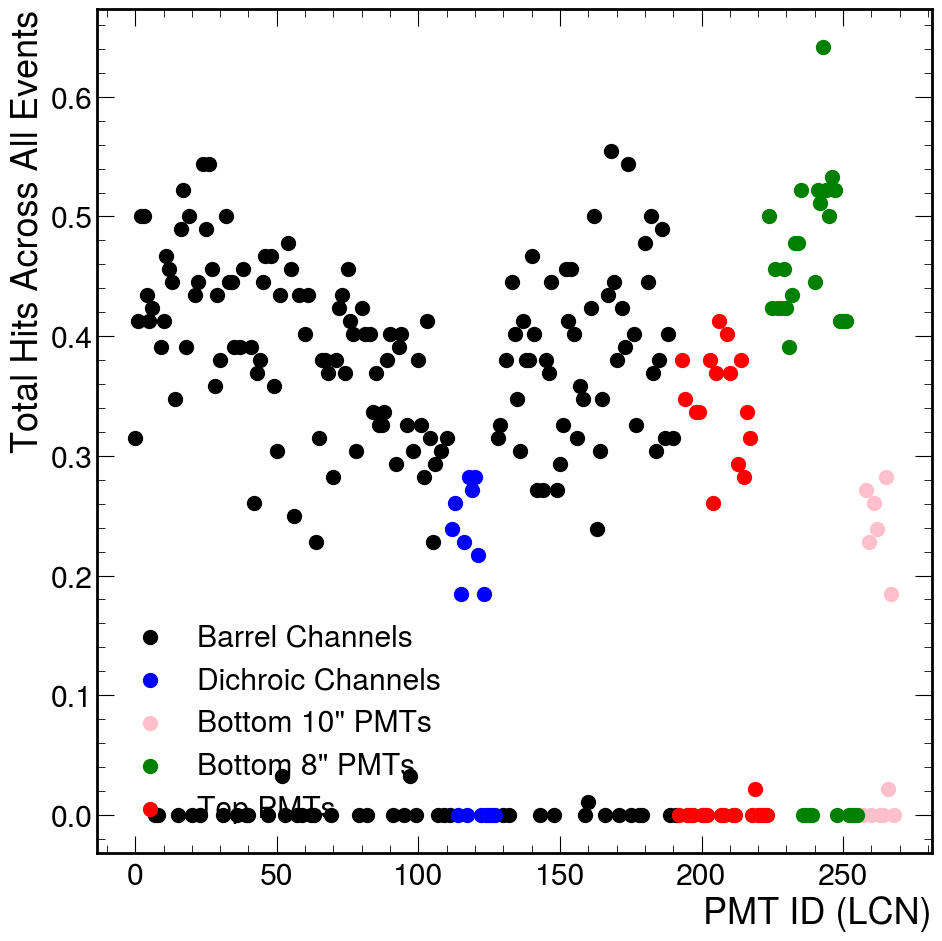

In [ ]:
pmt_id_to_ch = dict(zip(run.pmt_id, run.pmt_ch))

# Assuming each PMT ID maps directly to its LCN (i.e., pmt_id == lcn)
pmt_hit_counts = np.zeros(np.max(run.pmt_ch)+1, dtype=int)

# Count hits for online PMTs
for i, (pmt_ch, times) in enumerate(sorted(corrected_channel_hit_times.items())):
    cut_times = []
    for time in times:
        if -20<time<20:
            pmt_hit_counts[pmt_ch] += 1

print(np.max(run.pmt_ch))

coinc_hit_counts = pmt_hit_counts / len(michels)
print(len(michels))

# Plot
plt.figure(figsize=(10, 10))
#plt.scatter(range(len(pmt_hit_counts)), coinc_hit_counts, s=100, alpha=0.5, color='black')

# Optional: highlight barrel and dichroic
plt.scatter(barrel_channels, coinc_hit_counts[barrel_channels], s=100, alpha=1, color='black', label='Barrel Channels')
plt.scatter(dichroic_channels, coinc_hit_counts[dichroic_channels], s=100, alpha=1, color='blue', label='Dichroic Channels')
plt.scatter(behind_channels, coinc_hit_counts[behind_channels], s=100, alpha=1, color='pink', label='Bottom 10" PMTs')
plt.scatter(bottom_channels, coinc_hit_counts[bottom_channels], s=100, alpha=1, color='green', label='Bottom 8" PMTs')
plt.scatter(top_channels, coinc_hit_counts[top_channels], s=100, alpha=1, color='red', label='Top PMTs')

plt.xlabel("PMT ID (LCN)")
plt.ylabel("Total Hits Across All Events")
plt.legend(loc='lower left')
#plt.ylim(np.max(pmt_hit_counts)/2,2*np.max(pmt_hit_counts))
plt.tight_layout()


Dichroic avg: 0.000 ± 0.000 hits/event
Bottom 8" avg: 0.001 ± 0.000 hits/event
Ratio (dichroic/bottom): 0.50 ± 0.04


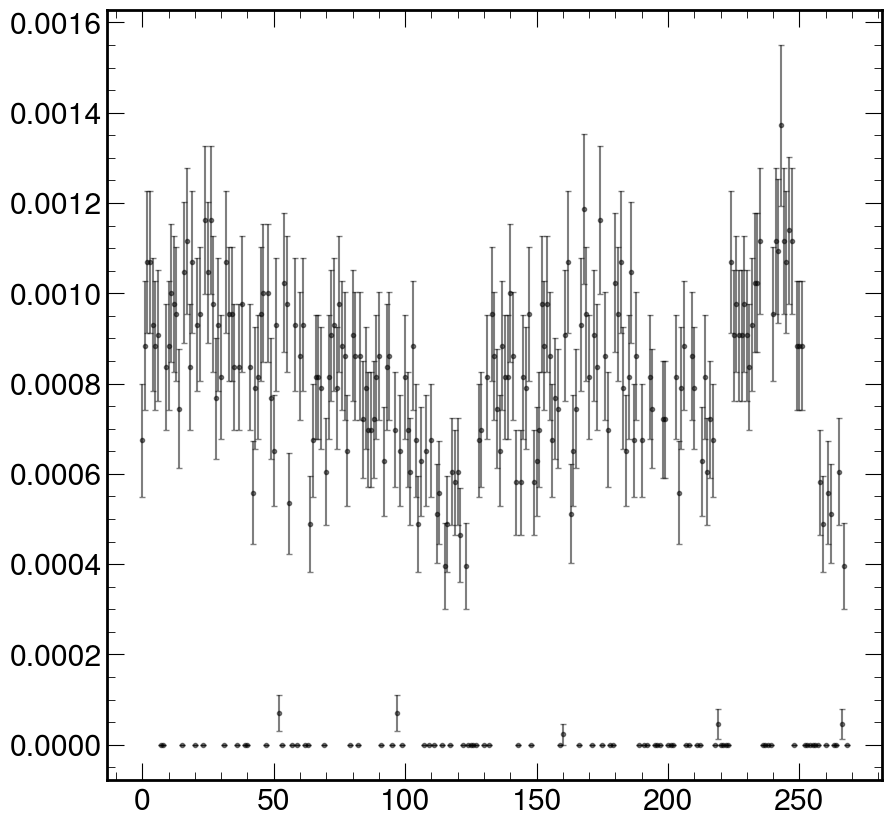

In [ ]:
import numpy as np
from uncertainties import ufloat  # Requires `uncertainties` package (pip install uncertainties)

# Convert hit counts to rates and propagate Poisson errors
pmt_hit_rates = []
pmt_hit_errors = []

for count in pmt_hit_counts:
    # For each PMT: rate = count / N_events, with uncertainty √count / N_events
    N_events = len(run.events)
    rate = count / N_events
    error = np.sqrt(count) / N_events  # Poisson error propagation
    pmt_hit_rates.append(rate)
    pmt_hit_errors.append(error)

# Convert to numpy arrays
pmt_hit_rates = np.array(pmt_hit_rates)
pmt_hit_errors = np.array(pmt_hit_errors)

# Plot with error bars
plt.errorbar(
    x=np.arange(len(pmt_hit_rates)),
    y=pmt_hit_rates,
    yerr=pmt_hit_errors,
    fmt='o',
    markersize=3,
    capsize=2,
    alpha=0.5,
    color='black',
    label='PMT hit rates ± 1σ'
)

def weighted_average_with_uncertainty(rates, errors):
    """Calculate weighted average and its uncertainty."""
    weights = 1 / (errors ** 2)
    avg = np.sum(weights * rates) / np.sum(weights)
    err = 1 / np.sqrt(np.sum(weights))
    return avg, err

# Dichroic channels
dichroic_rates = pmt_hit_rates[dichroic_channels]
dichroic_errors = pmt_hit_errors[dichroic_channels]
avg_dichroic, err_dichroic = weighted_average_with_uncertainty(
    dichroic_rates[dichroic_rates > 0.0001],
    dichroic_errors[dichroic_rates > 0.0001]
)

# Bottom 8" channels
bottom_rates = pmt_hit_rates[bottom_channels]
bottom_errors = pmt_hit_errors[bottom_channels]
avg_bottom, err_bottom = weighted_average_with_uncertainty(
    bottom_rates[bottom_rates > 0.0001],
    bottom_errors[bottom_rates > 0.0001]
)

print(f"Dichroic avg: {avg_dichroic:.3f} ± {err_dichroic:.3f} hits/event")
print(f"Bottom 8\" avg: {avg_bottom:.3f} ± {err_bottom:.3f} hits/event")

R = avg_dichroic / avg_bottom
R_err = R * np.sqrt((err_dichroic/avg_dichroic)**2 + (err_bottom/avg_bottom)**2)

print(f"Ratio (dichroic/bottom): {R:.2f} ± {R_err:.2f}")


[-22.6, -20, 30.8, -17, -19.7, 7.19, ..., -26.9, -13.9, 46.9, -8.3, -27.6]


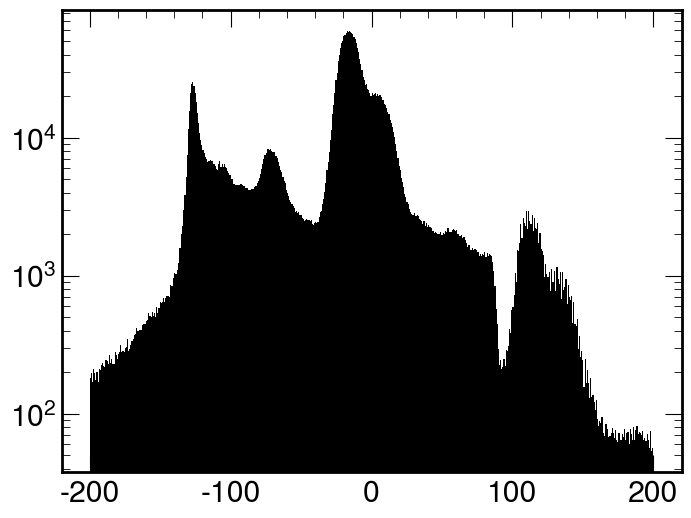

In [ ]:



times = [event.digit_time_ns for event in run.events]
print(times[0])

plt.figure(figsize=(8, 6))


times = ak.flatten(times) 


plt.hist(times, color='black', bins=500, range=(-200,200), label='Michel Candidates')
plt.yscale('log')

In [ ]:
# Now do cuts

# Timing (cable delays???? dichroicon board  may be wack)
# I think individual channels are wack - cant just look at board
# Yep, need to do individual cable delays!!

# position (fiducial?)

# normalize relative to bottom pmts

# do as a function of reco z (need updated EosSims - finish other shit!)

# am I really simualting what I am selecting from real events????

# ****** why are boards 0-50 inverted? *****

In [ ]:

plt.figure(figsize=(8, 6))
hep.hist2dplot(np.histogram2d(nhit_follower_early, total_gaussian_charge_pc_follower_early, bins=(100, 100), range=((0, 200), (0, 1500))), cmap='Blues', norm='log')

ValueError: x and y must have the same length.

<Figure size 800x600 with 0 Axes>

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x70a830b5cdf0>, cbar=<matplotlib.colorbar.Colorbar object at 0x70a83144f640>, text=[])

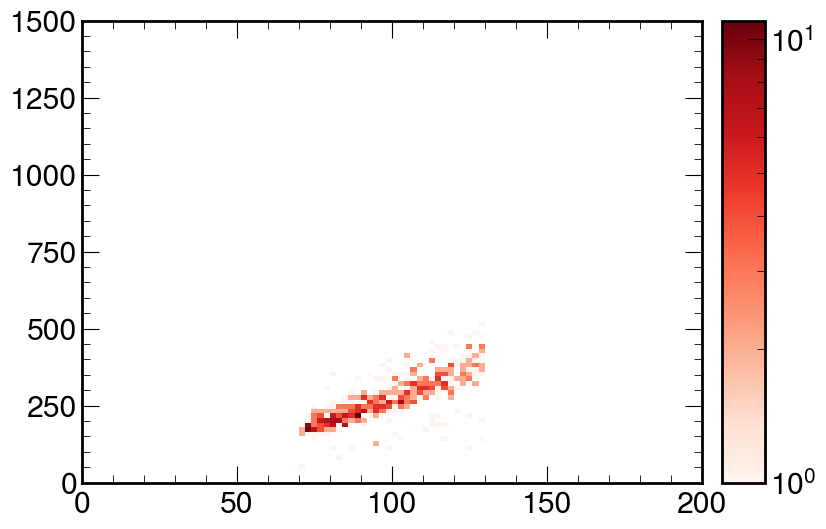

In [ ]:
plt.figure(figsize=(8, 6))
hep.hist2dplot(np.histogram2d(nhit_follower_late, total_gaussian_charge_pc_follower_late, bins=(100, 100), range=((0, 200), (0, 1500))), cmap='Reds', norm='log')

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x70a831b24220>, cbar=<matplotlib.colorbar.Colorbar object at 0x70a830a21100>, text=[])

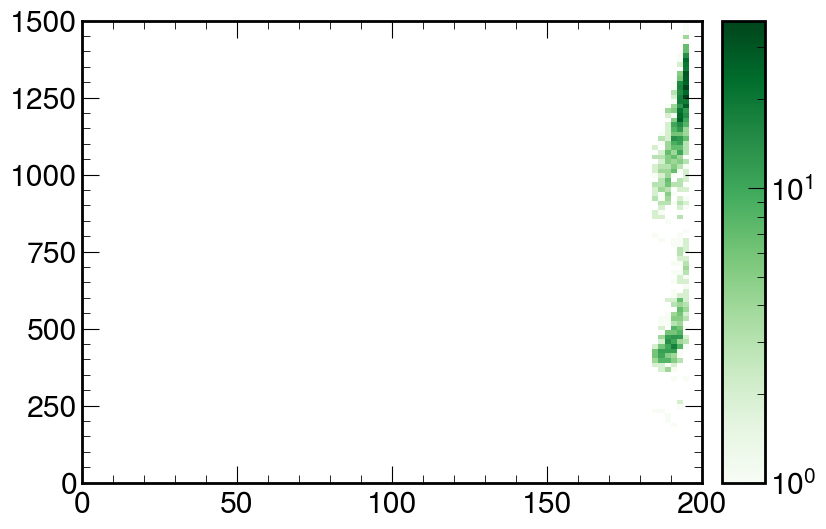

In [ ]:
plt.figure(figsize=(8, 6))
hep.hist2dplot(np.histogram2d(nhit_prompt, total_gaussian_charge_pc_prompt, bins=(100, 100), range=((0, 200), (0, 1500))), cmap='Greens', norm='log')


Text(22.58333333333333, 1, 'Total Charge per Trigger (pc)')

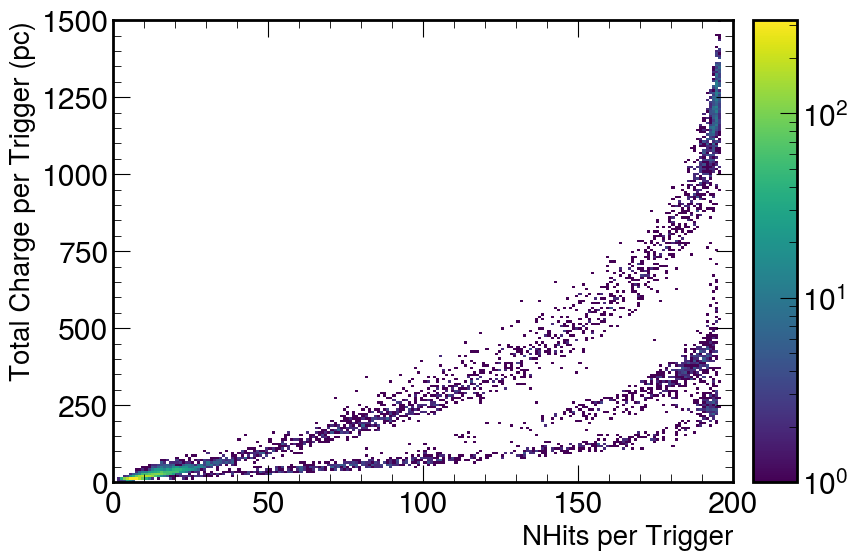

In [ ]:
nhits = [event.nhits for event in run.events]
charges = [event.total_log_charge_pc for event in run.events]

charge_log_bins = np.logspace(np.log10(2),np.log10(1500), bins)
nhit_log_bins = np.logspace(np.log10(2),np.log10(200), bins)

plt.figure(figsize=(8, 6))
hep.hist2dplot(np.histogram2d(nhits, charges, bins=(200, 200), range=((0, 200), (0, 1500))), norm='log')
plt.xlabel('NHits per Trigger', fontsize=20)
plt.ylabel('Total Charge per Trigger (pc)', fontsize=20)

In [ ]:
early_follower_times = [event.time_since_last_prompt_trigger_us for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<30]
late_follower_times = [event.time_since_last_prompt_trigger_us for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us>30]


fit_decay_hist(early_follower_times,bins=29,range=(0.5,30),tau_guess=2)
fit_decay_hist(late_follower_times,bins=30,range=(100,400),tau_guess=200)

/home/bharris/.conda/envs/mypythonenv/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:968: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 100000.

Text(14.33333333333333, 1, 'Total Charge per Trigger (pc)')

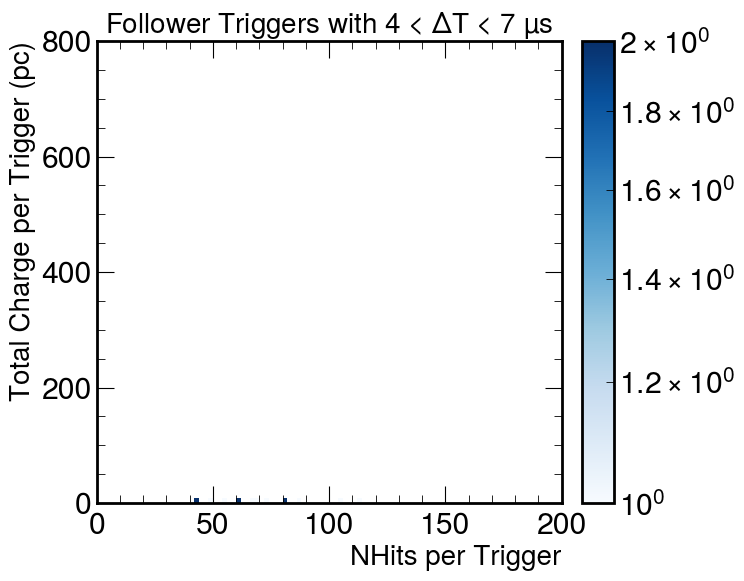

In [ ]:
nhits = [event.nhits for event in run.events if event.trigger_type==1 and 4<event.time_since_last_prompt_trigger_us<7]
charges = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type==1 and 4<event.time_since_last_prompt_trigger_us<7]
plt.figure(figsize=(6, 6))
hep.hist2dplot(np.histogram2d(nhits, charges, bins=(100, 100), range=((0, 200), (0, 800))), cmap='Blues', norm='log')
plt.title("Follower Triggers with 4 < $\Delta$T < 7 µs", fontsize=20)
plt.xlabel('NHits per Trigger', fontsize=20)
plt.ylabel('Total Charge per Trigger (pc)', fontsize=20)

Text(14.33333333333333, 1, 'Total Charge per Trigger (pc)')

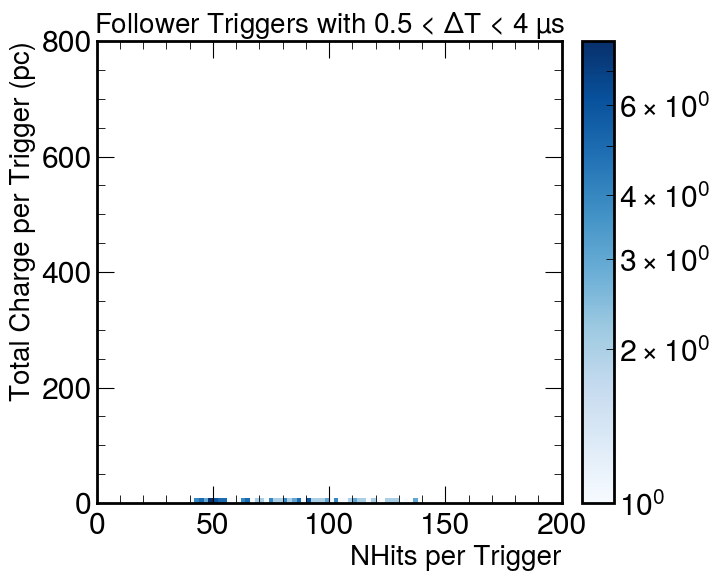

In [ ]:
nhits = [event.nhits for event in run.events if event.trigger_type==1 and 100<event.time_since_last_prompt_trigger_us<400]
charges = [event.total_gaussian_charge_pc for event in run.events if event.trigger_type==1 and 100<event.time_since_last_prompt_trigger_us<400]
plt.figure(figsize=(6, 6))
hep.hist2dplot(np.histogram2d(nhits, charges, bins=(100, 100), range=((0, 200), (0, 800))), cmap='Blues', norm='log')
plt.title("Follower Triggers with 0.5 < $\Delta$T < 4 µs", fontsize=20)
plt.xlabel('NHits per Trigger', fontsize=20)
plt.ylabel('Total Charge per Trigger (pc)', fontsize=20)

In [ ]:
waveforms = [event.waveforms for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.total_digit_charge_pc<500]
charge = [event.total_digit_charge_pc for event in run.events if event.trigger_type==1 and event.time_since_last_prompt_trigger_us<4 and event.total_digit_charge_pc<500]
print(len(waveforms))
print(len(charges))


467
483


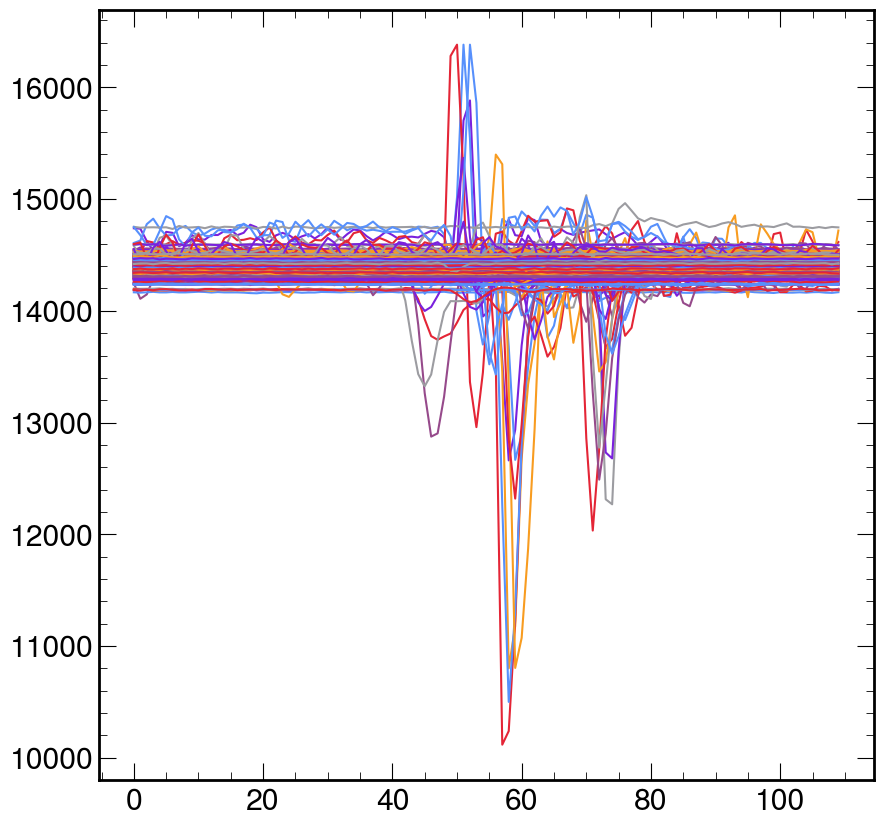

In [ ]:
n=400
for i in range(n):
    plt.plot(waveforms[i])

In [ ]:
wf = [event.waveforms for event in run.events if event.trigger_type==1 and event.total_digit_charge_pc>500 and event.time_since_last_prompt_trigger_us<4]
c = [event.total_digit_charge_pc for event in run.events if  event.trigger_type==1 and event.total_digit_charge_pc>500 and event.time_since_last_prompt_trigger_us<4]

print(len(wf), len(c))

16 16


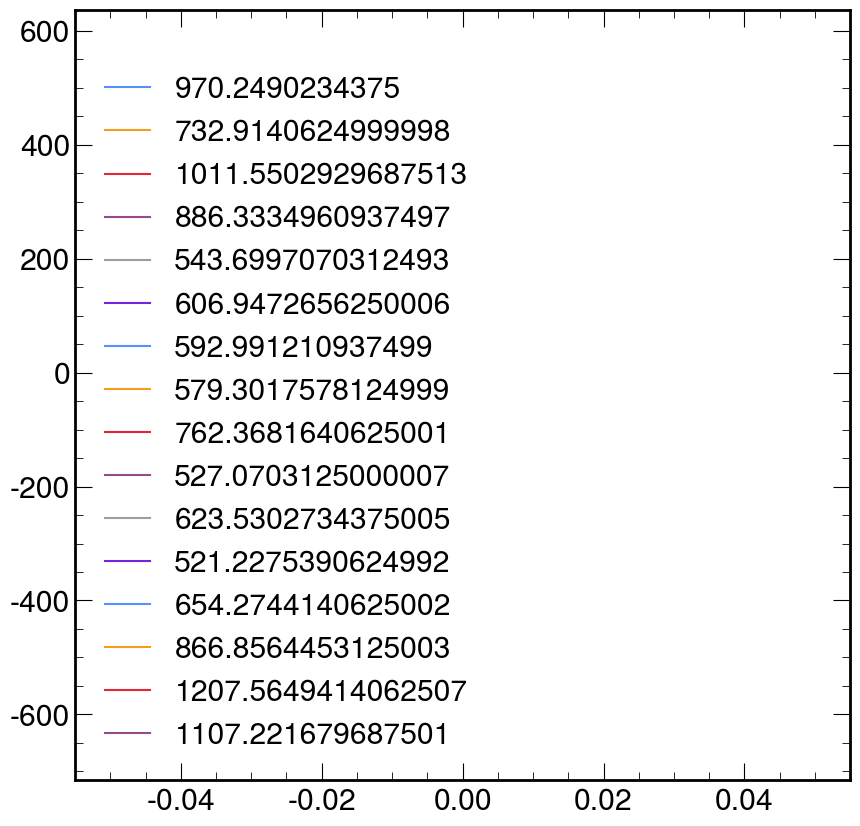

In [ ]:
for i in range(16):
    plt.plot(wf[i],label=c[i])
plt.legend()